In [1]:
# ruff: noqa: F405
%cd /lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/demo

from _shared import pl_k_sP, remyelin_ds, run_deg_groups, run_nmf, run_proc_per_ds, viz_defs, comp_spat_stats  # isort:skip

from functools import partial
from pathlib import Path
from pickle import dump, load
from warnings import catch_warnings, simplefilter

import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc
import uapl
import upsetplot as up
from matplotlib import pyplot as plt
from plotnine import *  # noqa: F403

import spatialpeeler as sP
from spatialpeeler.diag import comp_sparsity, sweep_uns

from scipy import io
import re

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/demo


/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
viz_defs(dpi=128)
RAND_SEED = 28
# define helper function for plotting
pl_help = partial(pl_k_sP, cond_col="Condition", sample_col="puck_id", 
ctl_val="Saline", sp_p_size=0.3)
SP_FACT_PAT_STR = "sP_p_hat_k={k}"
SP_GENE_PAT_STR = "sp_gene_id_k={k}"

#CASE_KS = [27, 19, 10]
CASE_KS = [6, 7, 5, 27, 8, 10, 19] 
#CASE_KS = [6, 7, 5, 27, 8, 10, 19, 2, 28, 9, 11]
CTL_KS = [14, 0, 1, 20, 22]

CASE_KS = [6, 27]
CTL_KS = [1]



In [3]:
# load dataset + run NMF
if (pth := Path("../.cache/rml.pkl")).exists():
    with open(pth, "rb") as f:
        rml = load(f)
else:
    adatas = remyelin_ds(
        Path("../data/remyelin-slideseq"),
        # load only subset of interest
        lambda obs: (
            (obs["GoodQuality"] == "Yes")
            & (
                ((obs["Timepoint"].isin([3])) & (obs["Condition"] == "LPC"))
                | (obs["Timepoint"].isin([12, 18]) & (obs["Condition"] == "Saline"))
            )
        ),
    )
    for e in adatas.values():
        sc.pp.filter_cells(e, min_counts=100)

    run_proc_per_ds(adatas)

    rml = ad.concat(adatas, label="puck_id", index_unique="_")
    sc.pp.filter_genes(rml, min_cells=rml.n_obs // 500)

    rml.var["SYMBOL"] = (
        sc.queries.biomart_annotations("mmusculus", ["ensembl_gene_id", "external_gene_name"])
        .set_index("ensembl_gene_id")
        .merge(rml.var.index.to_series(), left_index=True, right_index=True, how="right")["external_gene_name"]
        .fillna(rml.var.index.to_series())
    )

    rml.obs["puck_id_cond"] = rml.obs["puck_id"].str.cat(rml.obs["Condition"], sep="_")
    rml.obs["Condition"] = rml.obs["Condition"].astype("category").cat.reorder_categories(["Saline", "LPC"])

    run_nmf(rml, 30, RAND_SEED)

    pth.parent.mkdir(exist_ok=True)
    with open(pth, "wb") as f:
        dump(rml, f)
print(rml)

AnnData object with n_obs × n_vars = 93450 × 12127
    obs: 'Sample details', 'Animal', 'Timepoint', 'Condition', 'GoodQuality', 'n_counts', 'puck_id', 'puck_id_cond'
    var: 'n_cells', 'SYMBOL'
    obsm: 'spatial', 'X_nmf'
    varm: 'X_nmf'
    layers: 'counts'


In [8]:
puck_id_map = {
    "Puck_230130_34": "Puck_A",
    "Puck_230130_37": "Puck_B",
    "Puck_230321_19": "Puck_C",
    "Puck_230321_20": "Puck_D",
}

rml.obs["puck_id"] = (
    rml.obs["puck_id"]
    .map(puck_id_map)
    .astype("category")
)


7603 / 93450 rml spots matched to the cropped dataset (8.1%)
38104 barcodes in the cropped dataset total
          sum   size  pct
puck_id                  
Puck_A   1933  24382  7.9
Puck_B   1373  20401  6.7
Puck_C   2051  23088  8.9
Puck_D   2246  25579  8.8


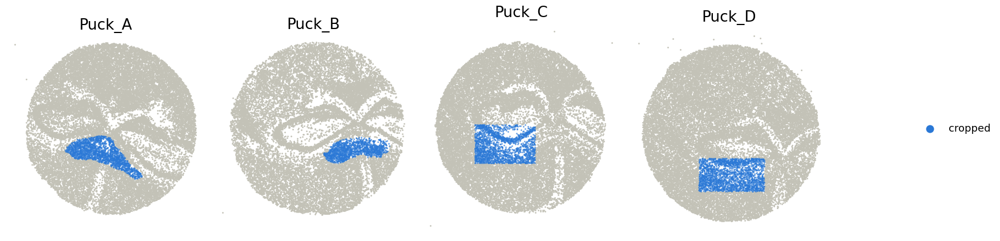

In [11]:


################# Importing the cropped data ####################
base = "/lustre/scratch126/gengen/teams_v2/marks/dp31//SpatialPeeler/Data/Remyelin_Slide-seq/all_final_cropped_pucks_standardpipeline"
merged_counts = io.mmread(f"{base}/all_final_cropped_pucks_standardpipeline_counts_merged.mtx").tocsr()
obs_names = pd.read_csv(f"{base}/all_final_cropped_pucks_standardpipeline_barcodes.tsv", header=None)[0].values
var_names = pd.read_csv(f"{base}/all_final_cropped_pucks_standardpipeline_features.tsv", header=None)[0].values
obs = pd.read_csv(f"{base}/all_final_cropped_pucks_standardpipeline_metadata.csv", index_col=0)

assert all(obs.index == obs_names), "obs metadata order doesn't match the barcodes file"

adata_cropped = sc.AnnData(X=merged_counts.T, obs=obs)  # X should be (cells x genes)
adata_cropped.obs_names = obs_names
adata_cropped.var_names = var_names
###################################################

# --- reconcile barcode naming: cropped is "{puck_id}_{barcode}-N", rml is "{barcode}-N_{puck_id}" ---
pattern = r"^(?P<puck>Puck_\d+_\d+)_(?P<barcode>[ACGTN]+-\d+)$"
parsed = adata_cropped.obs_names.str.extract(pattern)
assert parsed.notna().all().all(), "some cropped obs_names didn't match the expected Puck_..._barcode-N pattern"
adata_cropped.obs_names = parsed["barcode"] + "_" + parsed["puck"]

# --- add cropped/non-cropped column onto rml, matched by barcode ---
cropped_barcodes = set(adata_cropped.obs_names)
rml.obs["cropped"] = rml.obs_names.isin(cropped_barcodes)

n_matched = int(rml.obs["cropped"].sum())
print(f"{n_matched} / {rml.n_obs} rml spots matched to the cropped dataset ({n_matched / rml.n_obs:.1%})")
print(f"{len(cropped_barcodes)} barcodes in the cropped dataset total")

# per-puck match rate, as a sanity check that "cropped" looks like a real spatial subregion
print(
    rml.obs.groupby("puck_id", observed=True)["cropped"]
    .agg(["sum", "size"])
    .assign(pct=lambda d: (100 * d["sum"] / d["size"]).round(1))
)

# --- visualize cropped (blue) vs non-cropped (grey) spots per puck ---
BG_COLOR = "#c3c2b7"
FG_COLOR = "#2a78d6"

puck_ids = rml.obs["puck_id"].cat.remove_unused_categories().cat.categories.tolist()

fig, axes = plt.subplots(1, len(puck_ids), figsize=(4 * len(puck_ids), 4.5), squeeze=False)
axes = axes[0]

for ax, puck in zip(axes, puck_ids):
    sub = rml[rml.obs["puck_id"] == puck]
    xy = sub.obsm["spatial"]
    x, y = xy["x"].to_numpy(), xy["y"].to_numpy()
    is_cropped = sub.obs["cropped"].to_numpy()

    ax.scatter(x[~is_cropped], y[~is_cropped], s=4, c=BG_COLOR, linewidths=0)
    ax.scatter(x[is_cropped], y[is_cropped], s=4, c=FG_COLOR, alpha=0.7, linewidths=0, label="cropped")

    ax.set_title(puck, fontsize=19)
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

handles, labels = axes[0].get_legend_handles_labels()
leg = fig.legend(handles, labels, loc="center left", bbox_to_anchor=(1.0, 0.5), frameon=False, fontsize=13)
for h in leg.legend_handles:
    h.set_sizes([100])
    h.set_alpha(1)

#fig.suptitle("cropped vs. non-cropped spots")
fig.tight_layout(rect=[0, 0, 0.92, 1])

fig_dir = Path("../figures")
fig_dir.mkdir(exist_ok=True)
fig.savefig(fig_dir / "rml_cropped_vs_noncropped.png", dpi=300, bbox_inches="tight")
plt.show()


before proceeding with spatialPeeler, we inspect our count matrix and NMF factors to assess their sparsity

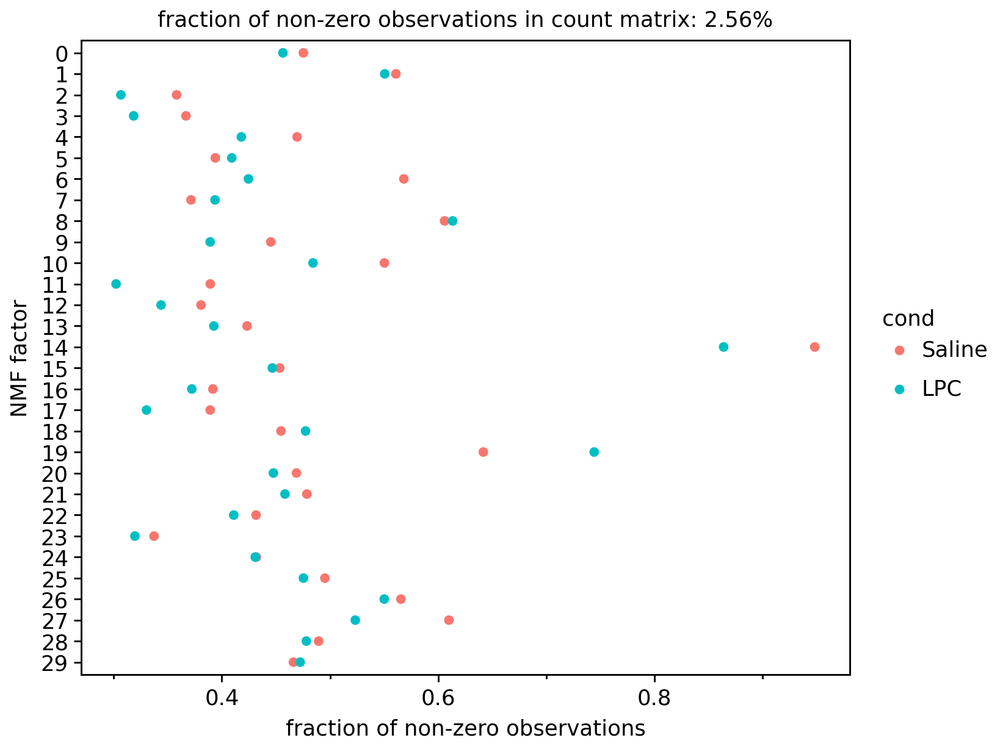

In [4]:
X_spars = rml.X.nnz / np.prod(rml.X.shape)  # ty:ignore[unresolved-attribute]
(
    comp_sparsity(rml.obsm["X_nmf"], cond=rml.obs["Condition"])
    >> ggplot()
    + aes(x="density", y="column", color="cond")
    + geom_point()
    + scale_y_discrete(limits=reversed)  # ty:ignore[invalid-argument-type]
    + labs(
        x="fraction of non-zero observations",
        y="NMF factor",
        title=f"fraction of non-zero observations in count matrix: {X_spars * 100:.02f}%",
    )
).show()

we see that the dataset is overall quite sparse (only ~1% of the data is non zero)
and this is reflected in the factors, which are also mostly quite sparse \
as such, we threshold our factor regression analysis to only include cells which are non-sparse for that factor

In [5]:
# run factor-wise regression step
for k in range(rml.obsm["X_nmf"].shape[1]):
    sP.run_fact_reg(
        rml,
        "Condition",
        "Saline",
        k,
        SP_FACT_PAT_STR.format(k=k),
        X_key="X_nmf",
        filt=lambda adata: adata[adata.obsm["X_nmf"][:, k] > 0, :],
    )

print(rml)

AnnData object with n_obs × n_vars = 93450 × 12127
    obs: 'Sample details', 'Animal', 'Timepoint', 'Condition', 'GoodQuality', 'n_counts', 'puck_id', 'puck_id_cond'
    var: 'n_cells', 'SYMBOL'
    uns: 'sP_p_hat_k=0', 'sP_p_hat_k=1', 'sP_p_hat_k=2', 'sP_p_hat_k=3', 'sP_p_hat_k=4', 'sP_p_hat_k=5', 'sP_p_hat_k=6', 'sP_p_hat_k=7', 'sP_p_hat_k=8', 'sP_p_hat_k=9', 'sP_p_hat_k=10', 'sP_p_hat_k=11', 'sP_p_hat_k=12', 'sP_p_hat_k=13', 'sP_p_hat_k=14', 'sP_p_hat_k=15', 'sP_p_hat_k=16', 'sP_p_hat_k=17', 'sP_p_hat_k=18', 'sP_p_hat_k=19', 'sP_p_hat_k=20', 'sP_p_hat_k=21', 'sP_p_hat_k=22', 'sP_p_hat_k=23', 'sP_p_hat_k=24', 'sP_p_hat_k=25', 'sP_p_hat_k=26', 'sP_p_hat_k=27', 'sP_p_hat_k=28', 'sP_p_hat_k=29'
    obsm: 'spatial', 'X_nmf', 'sP_p_hat_k=0', 'sP_p_hat_k=1', 'sP_p_hat_k=2', 'sP_p_hat_k=3', 'sP_p_hat_k=4', 'sP_p_hat_k=5', 'sP_p_hat_k=6', 'sP_p_hat_k=7', 'sP_p_hat_k=8', 'sP_p_hat_k=9', 'sP_p_hat_k=10', 'sP_p_hat_k=11', 'sP_p_hat_k=12', 'sP_p_hat_k=13', 'sP_p_hat_k=14', 'sP_p_hat_k=15', 'sP_

we now assess our resulting regression outputs distributions \
we can extract and collate the model betas and other statistics using the sweep_uns function

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log


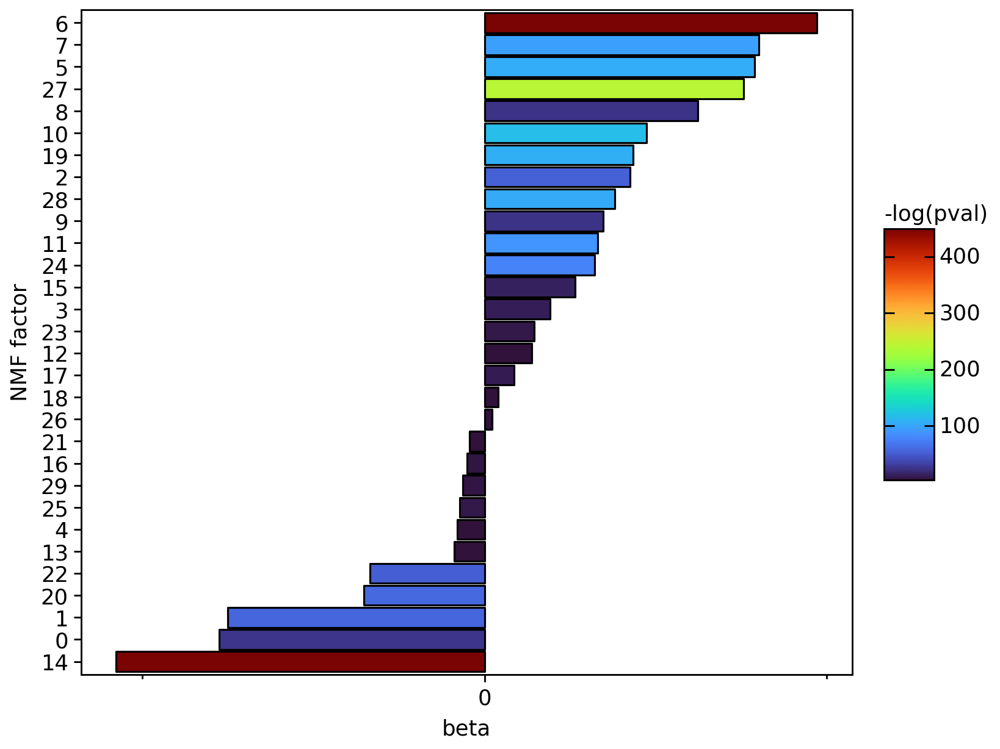

In [6]:
(
    sweep_uns(rml, SP_FACT_PAT_STR)
    >> ggplot()
    + aes(x="reorder(k, beta)", fill="-np.log(pval)", y="beta")
    + geom_col(color="black")
    + coord_flip()
    + labs(fill="-log(pval)", x="NMF factor")
    + scale_fill_cmap("turbo")
    + scale_y_symlog()
).show() 
 


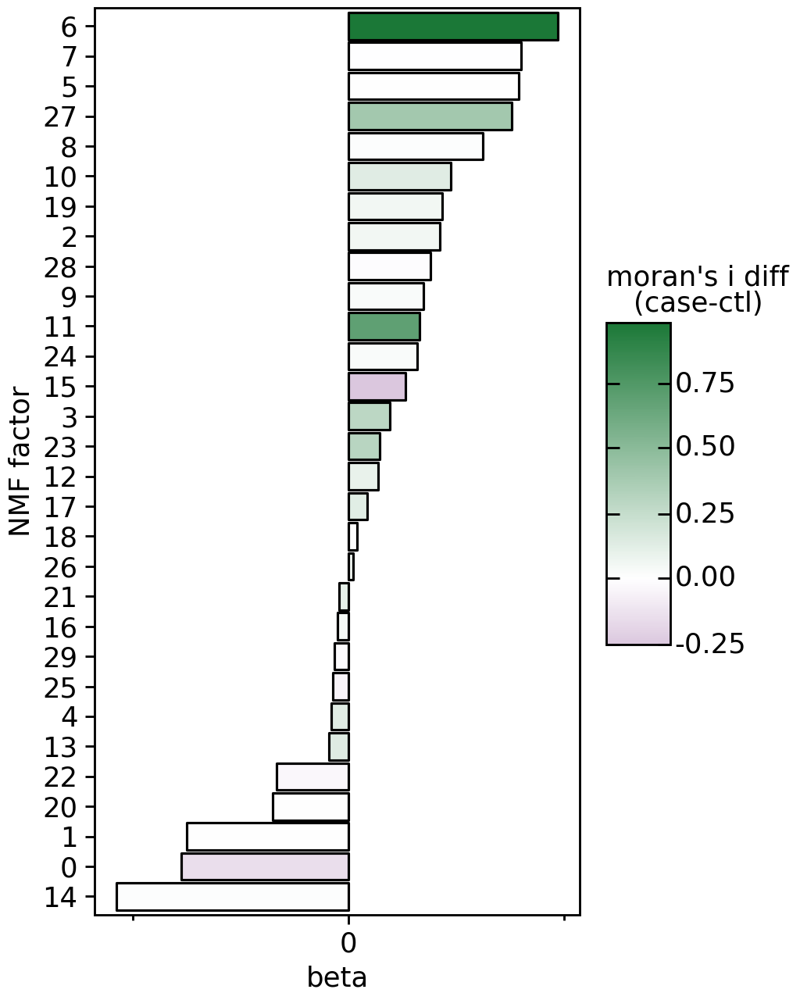

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 4 x 5 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: /lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/figures/rml_moran_diff.pdf


In [7]:
sp_stat_df, sp_stat_pl = comp_spat_stats(rml, SP_FACT_PAT_STR, "puck_id", "Condition", "Saline")

moran_diff = (
    sp_stat_df.query("stat == \"moran's i\"")[["k", "diff"]]
    .drop_duplicates()
    .assign(k=lambda d: d["k"].astype(str))  # sweep_uns's "k" is captured as a string
)


p_moran_diff = (
    sweep_uns(rml, SP_FACT_PAT_STR)
    .merge(moran_diff, on="k")
    >> ggplot()
    + aes(x="reorder(k, beta)", fill="diff", y="beta")
    + geom_col(color="black")
    + coord_flip()
    + labs(fill="moran's i diff\n(case-ctl)", x="NMF factor")
    + scale_fill_gradient2(low="#762a83", mid="white", high="#1b7837", midpoint=0)
    + scale_y_symlog()
    + theme(figure_size=(4, 5))  # (width, height) in inches
)
p_moran_diff.show()

fig_dir = Path("/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/figures")
fig_dir.mkdir(exist_ok=True)
p_moran_diff.save(fig_dir / "rml_moran_diff.pdf")



to explore the spatial properties of the resulting factor patterns, we can compute and plot
spatial statistics for each on a per sample basis (in this case Geary's C and Morans' I):

In [9]:
rml.raw = None  # drop raw to avoid copying the full sparse matrix on every AnnData slice in comp_spat_stats

In [8]:
sp_stat_df, sp_stat_pl = comp_spat_stats(rml, SP_FACT_PAT_STR, "puck_id", "Condition", "Saline")

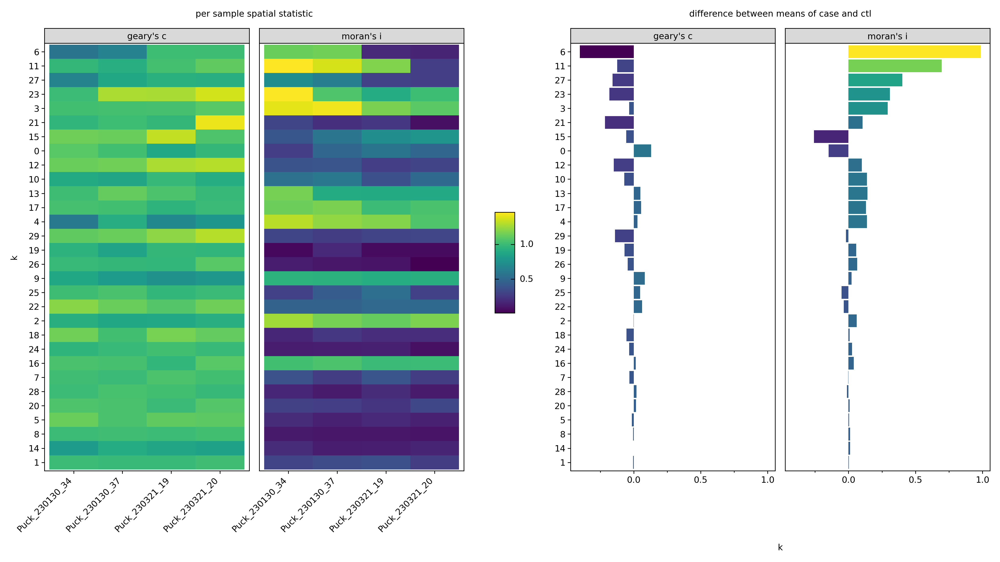

In [9]:
(sp_stat_pl & theme(figure_size=(16, 9))).show()  # ty:ignore[unsupported-operator]

we plot the spatial distributions for all case-specific factors:

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



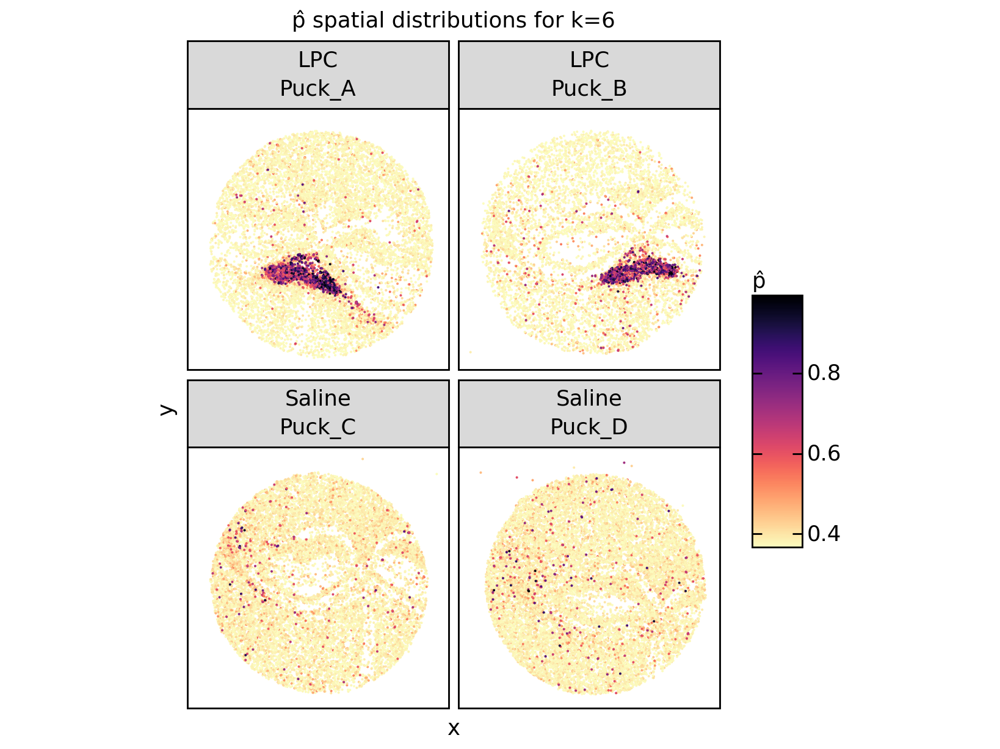

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=6_spatial_p-hat_1.png


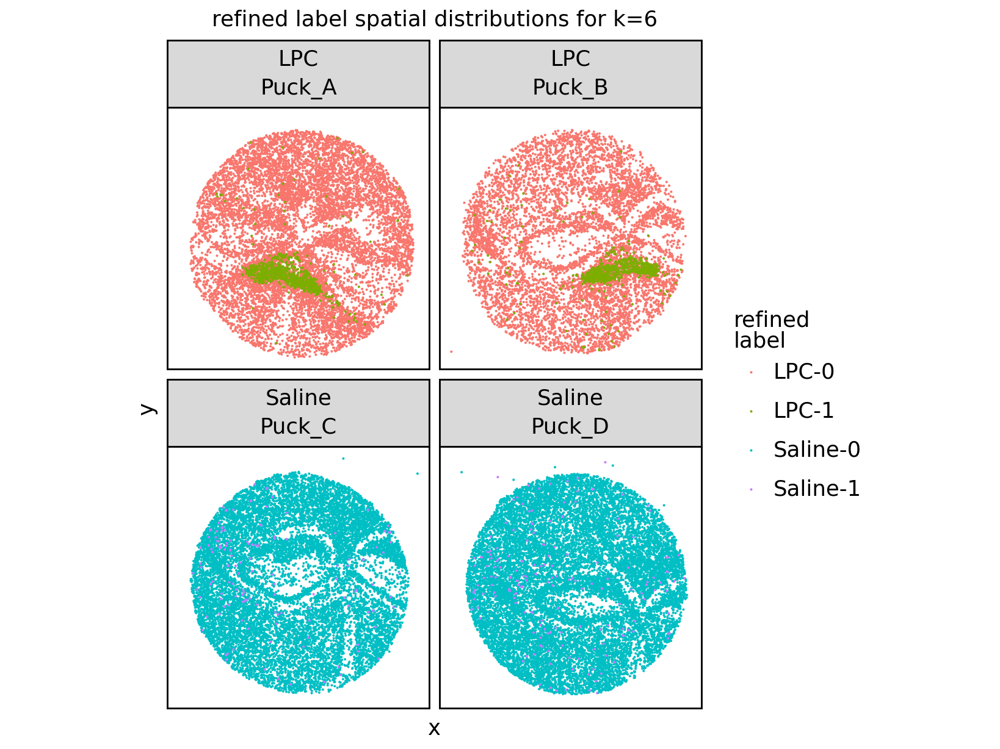

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=6_spatial_bin_2.png
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



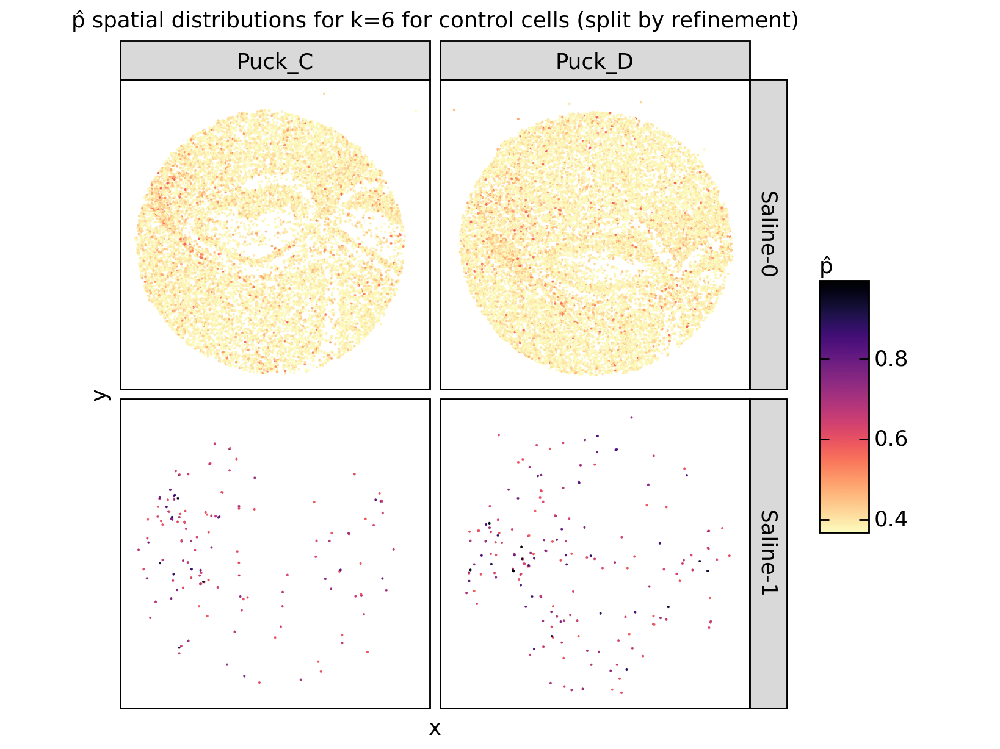

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=6_spatial_p-hat_(ctl-split)_3.png
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



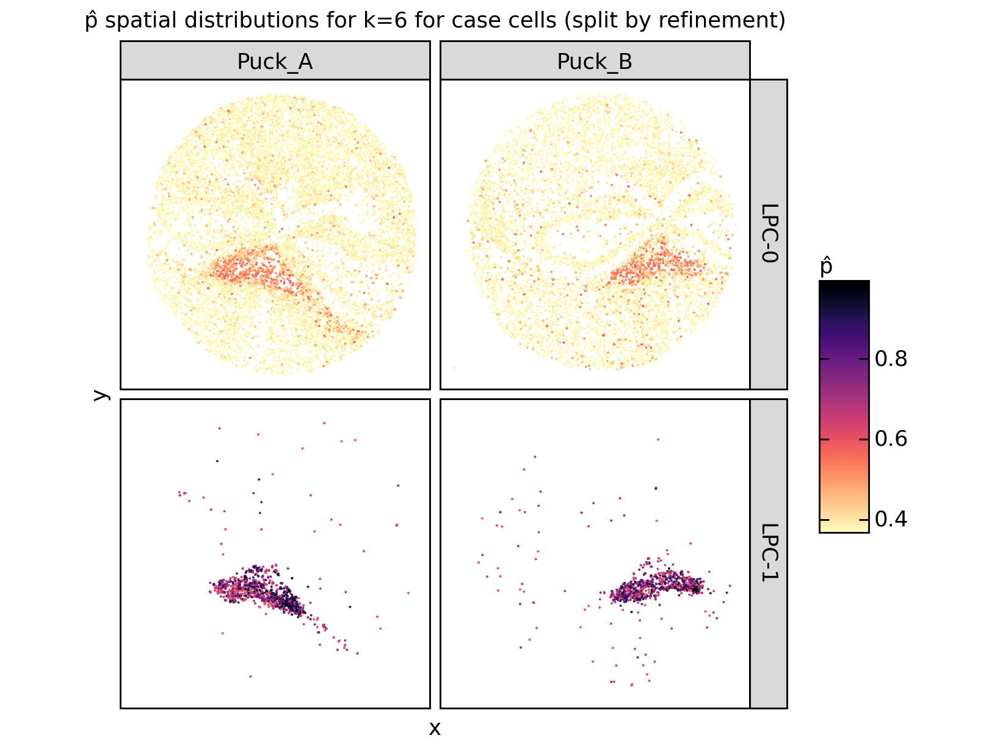

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=6_spatial_p-hat_(case-split)_4.png


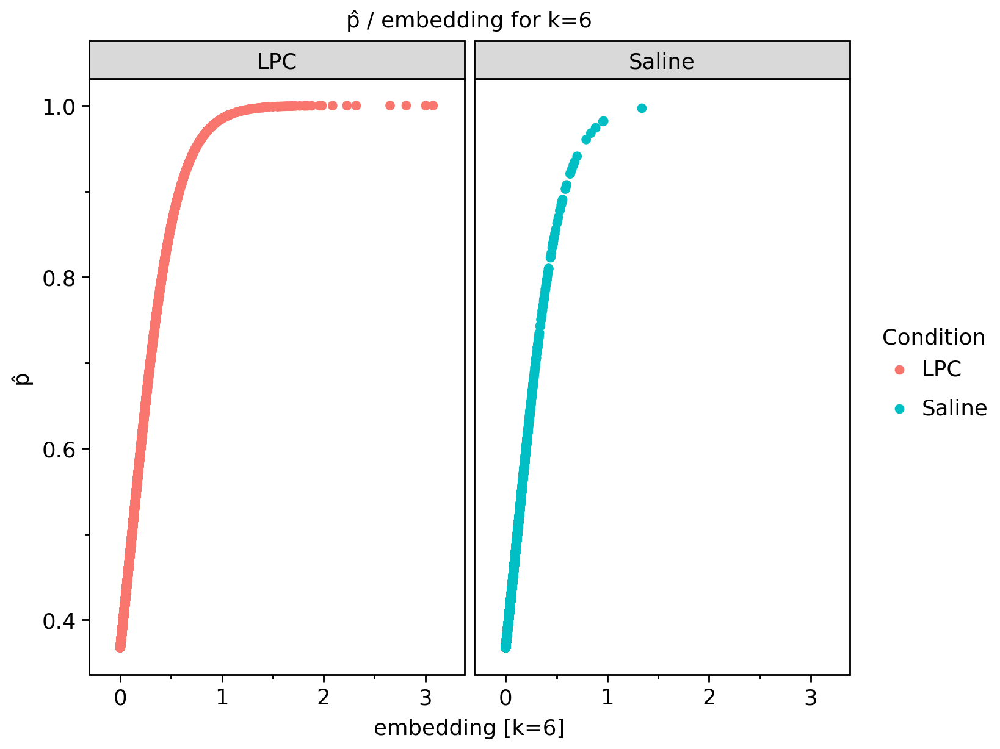

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=6_emb-p-hat_5.png


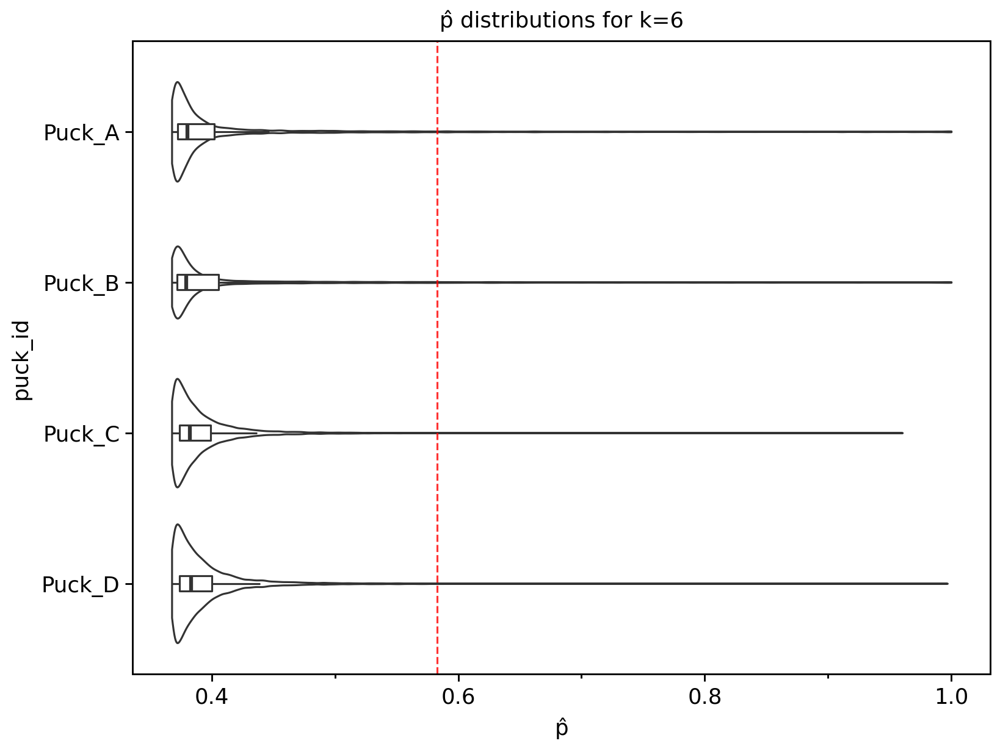

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=6_sample_p-hat_6.png


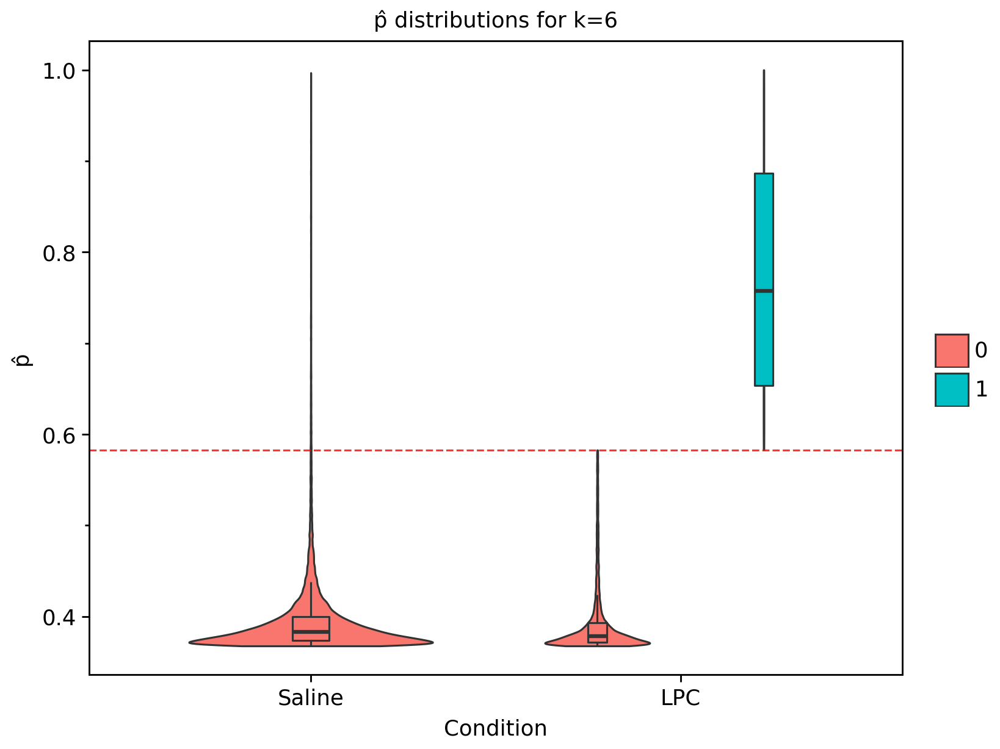

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=6_group_p-hat_7.png


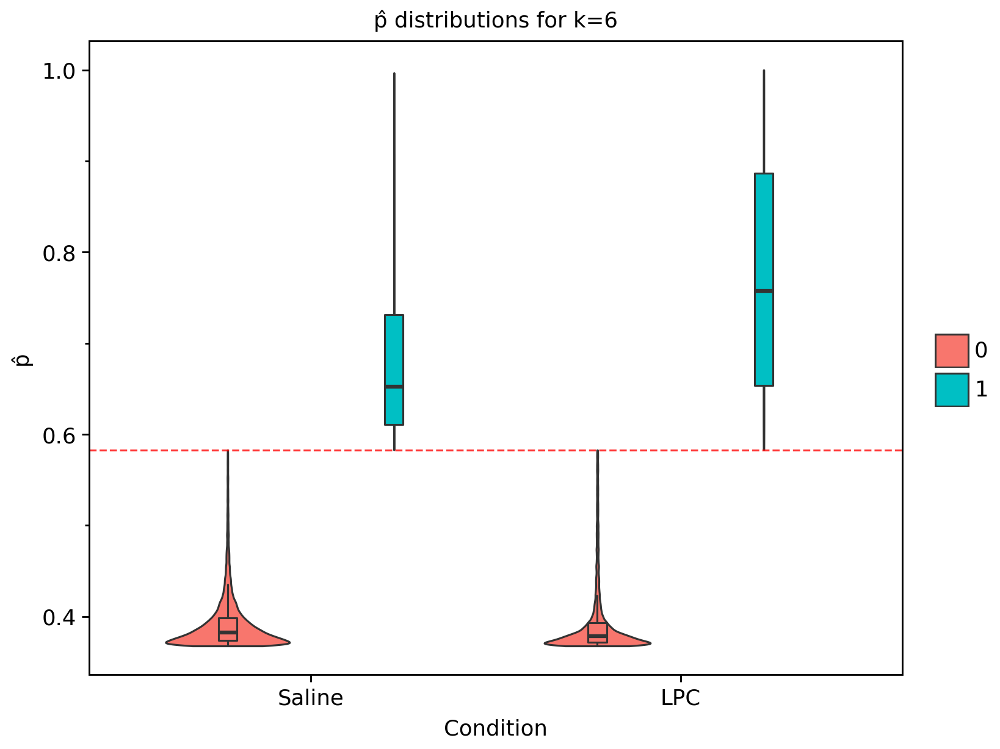

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=6_group_p-hat_(ctl_split)_8.png
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



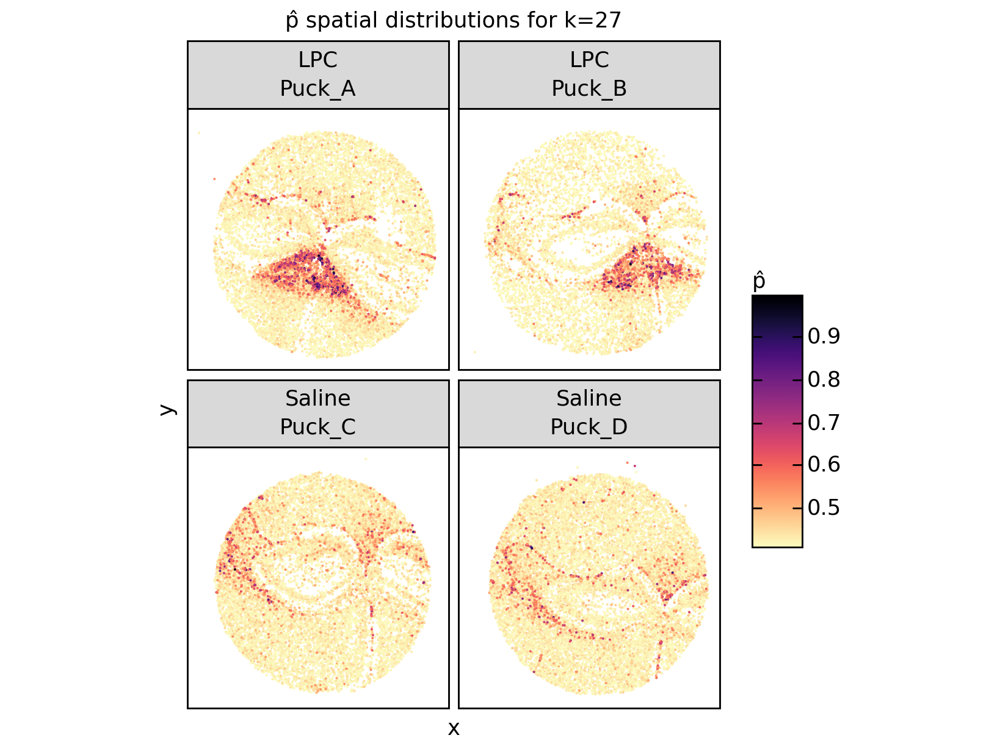

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=27_spatial_p-hat_1.png


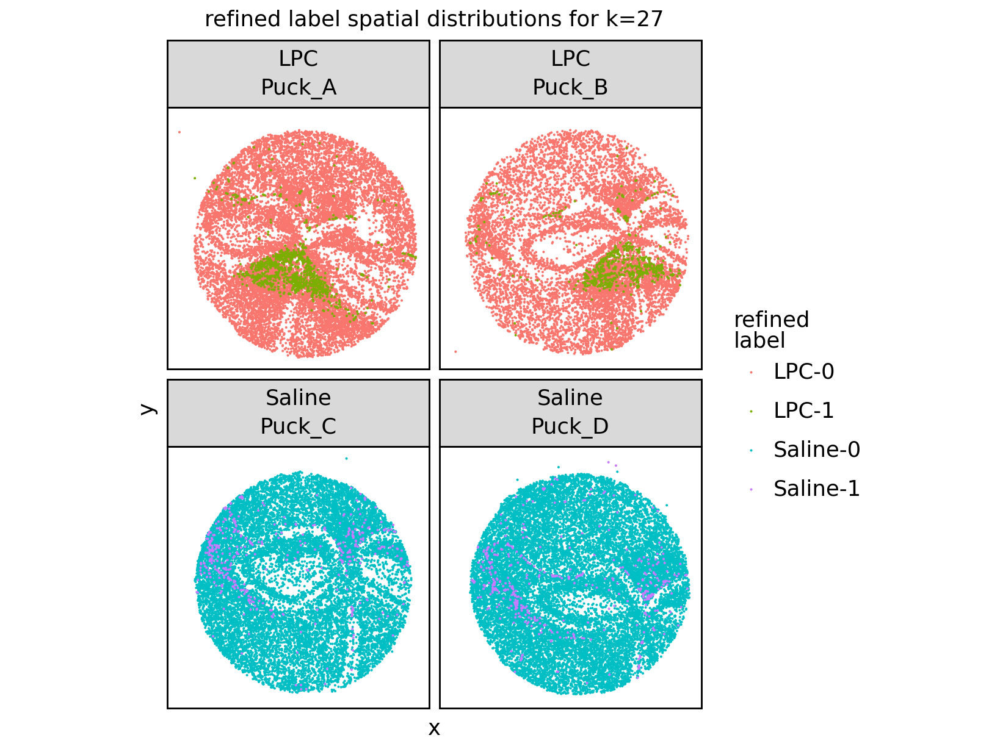

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=27_spatial_bin_2.png
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



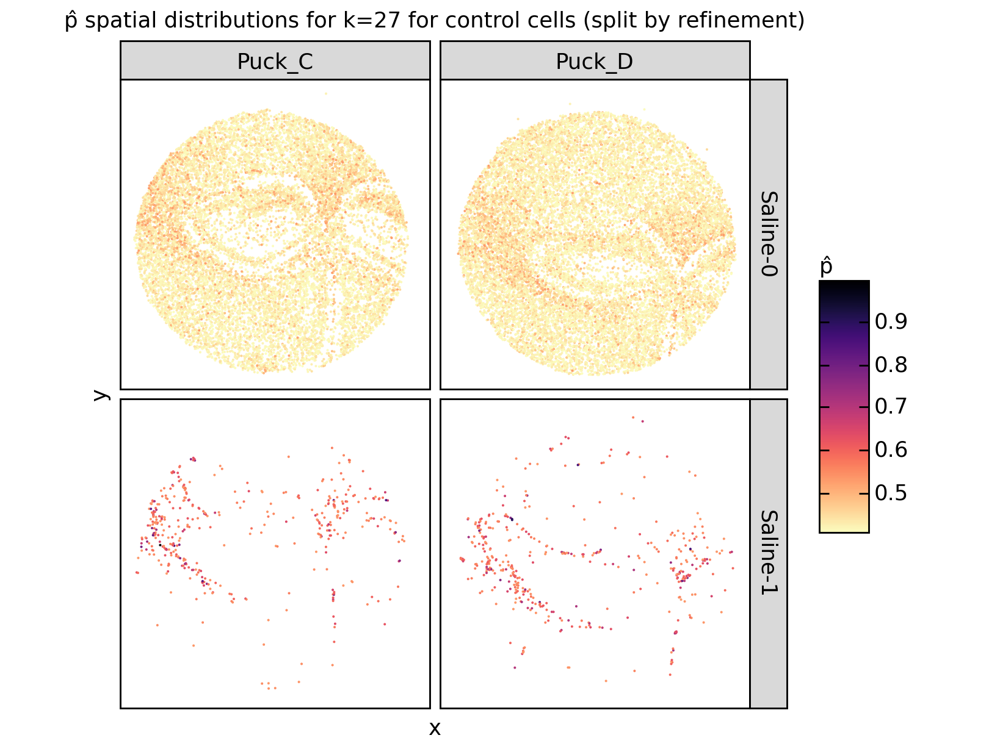

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=27_spatial_p-hat_(ctl-split)_3.png
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



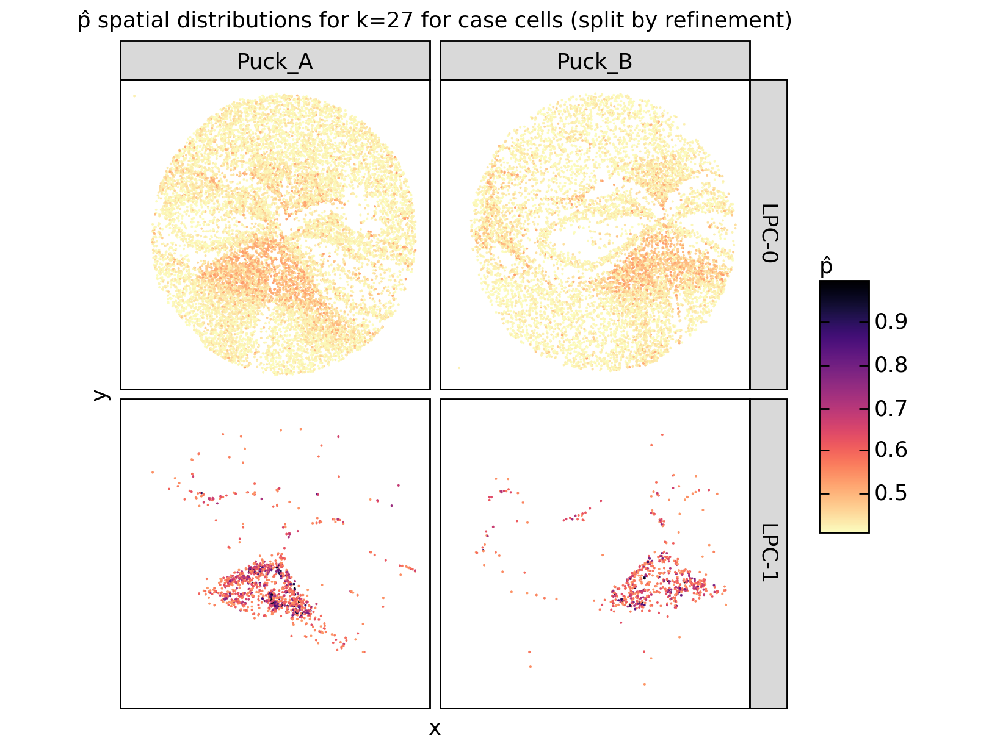

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=27_spatial_p-hat_(case-split)_4.png


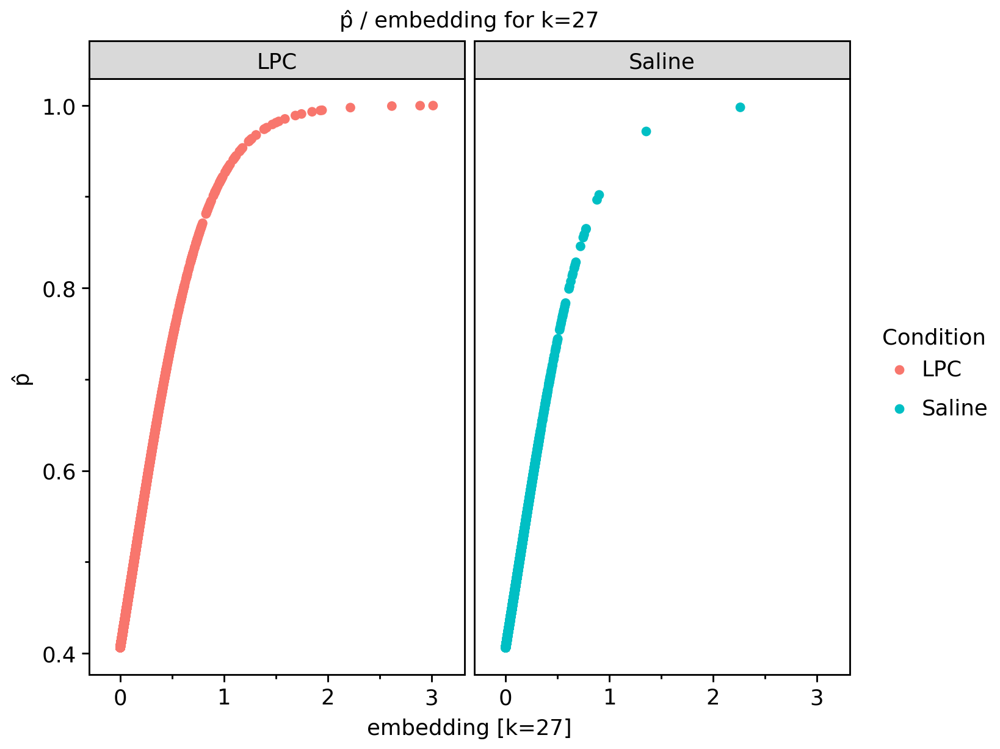

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=27_emb-p-hat_5.png


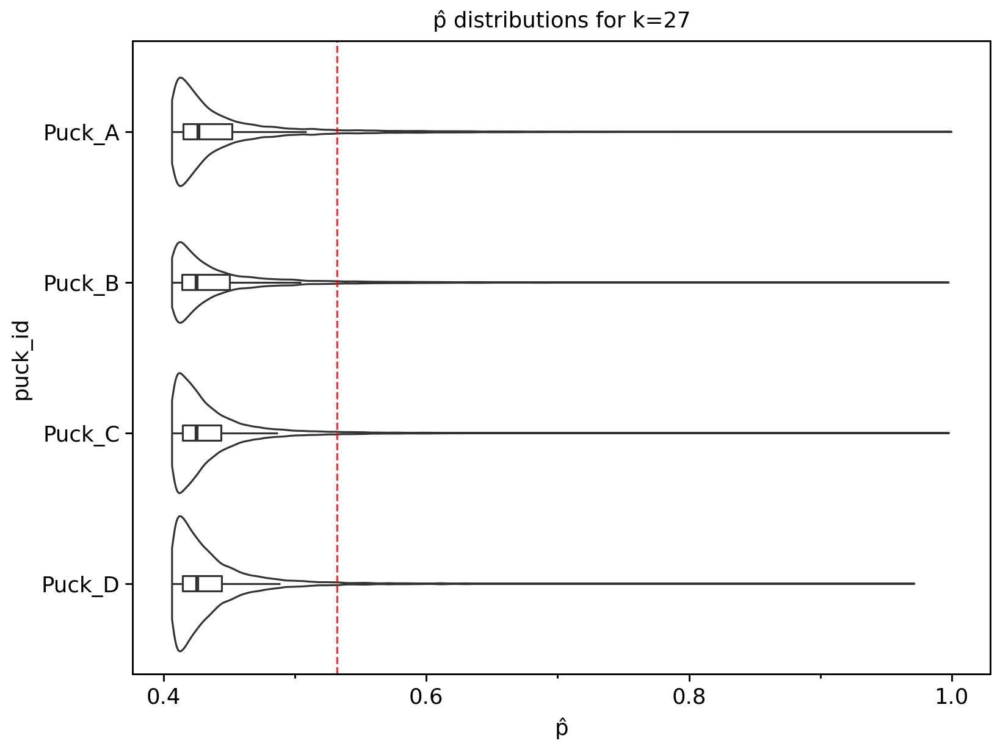

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=27_sample_p-hat_6.png


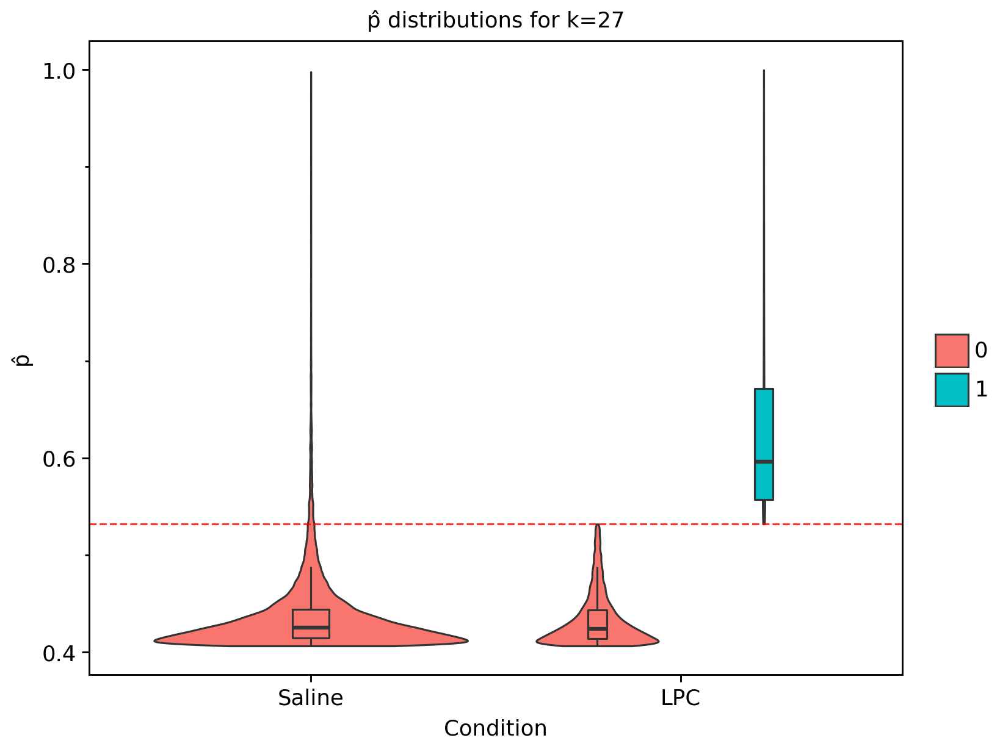

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=27_group_p-hat_7.png


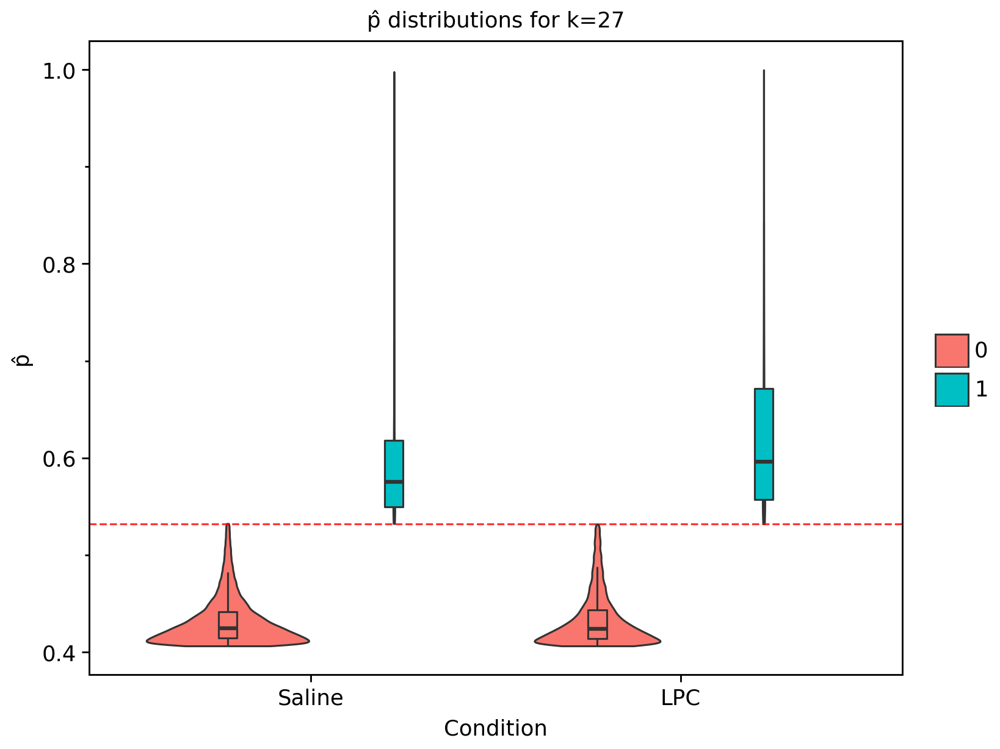

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=27_group_p-hat_(ctl_split)_8.png


In [14]:

#for k in CASE_KS: #
#    for p in pl_help(rml[rml.obsm["X_nmf"][:, k] > 0, :], k, sp_p_size=0.7).values():
#        p.show()



for k in CASE_KS:
    counter=0
    for name, p in pl_help(rml[rml.obsm["X_nmf"][:, k] > 0, :], k, sp_p_size=0.7).items():
        if "p-hat" in name and "spatial" in name:
            p = p + scale_fill_cmap("magma_r")  # swap "magma" for whichever cmap you want
        p.show()
        
        safe_name = name.replace(" ", "_").replace("/", "-")
        counter += 1
        p.save(fig_dir / f"rml_case_k={k}_{safe_name}_{counter}.png", dpi=300)


we plot the spatial distributions for all control-specific factors:

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



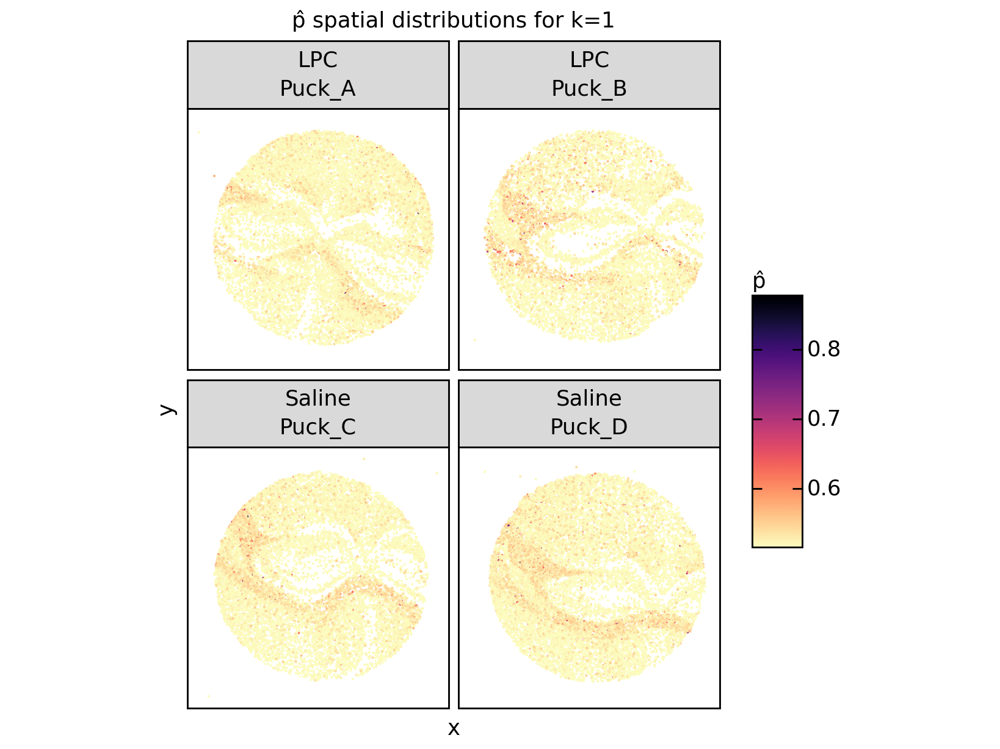

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=1_spatial_p-hat_1.png


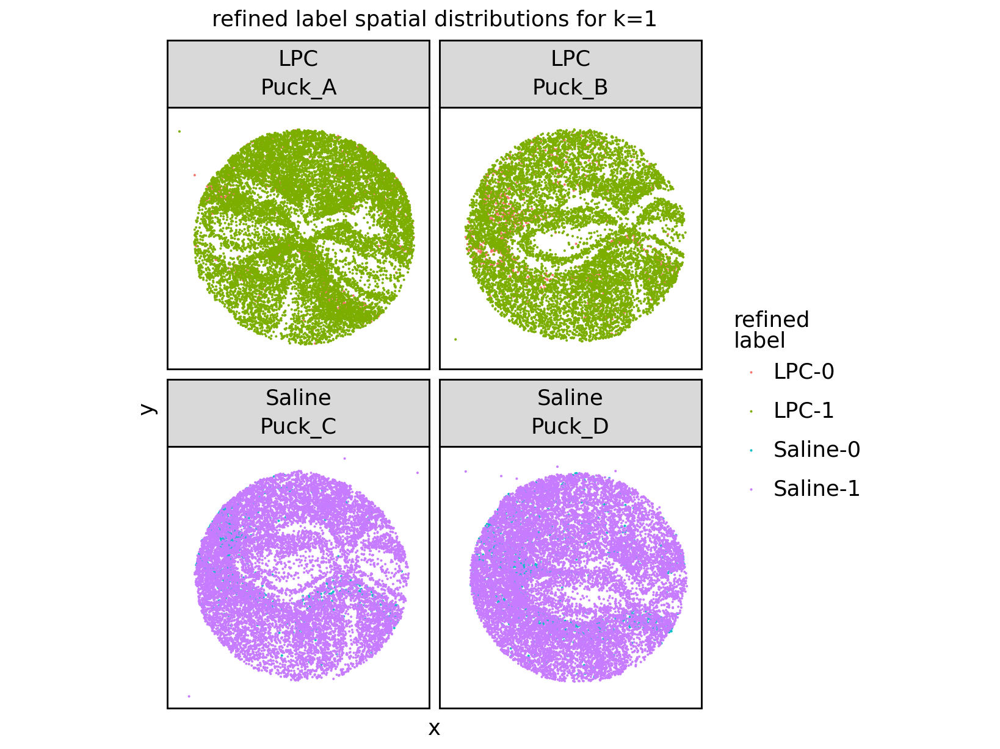

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=1_spatial_bin_2.png
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



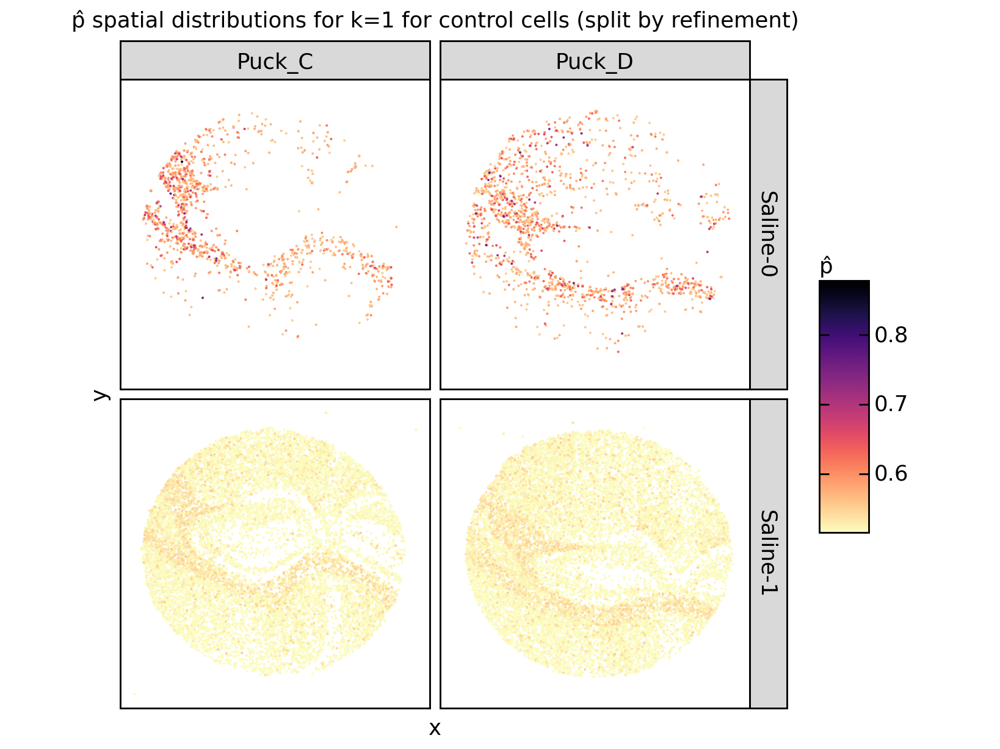

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=1_spatial_p-hat_(ctl-split)_3.png
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/scales/scales.py:48: PlotnineWarning: Scale for 'fill' is already present.
Adding another scale for 'fill',
which will replace the existing scale.



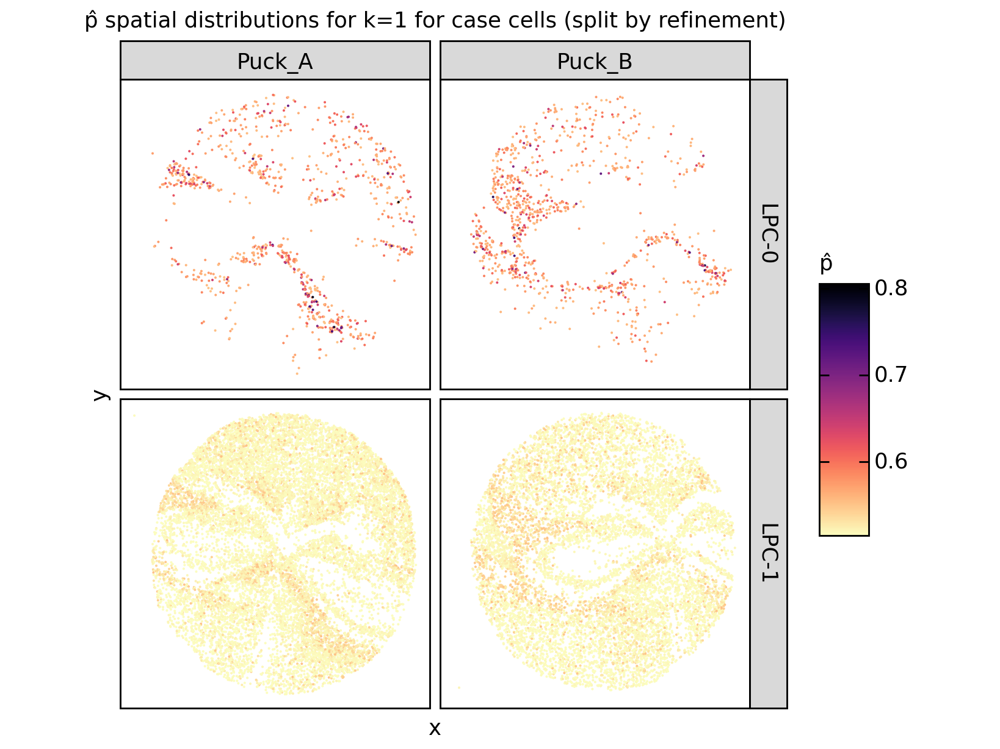

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=1_spatial_p-hat_(case-split)_4.png


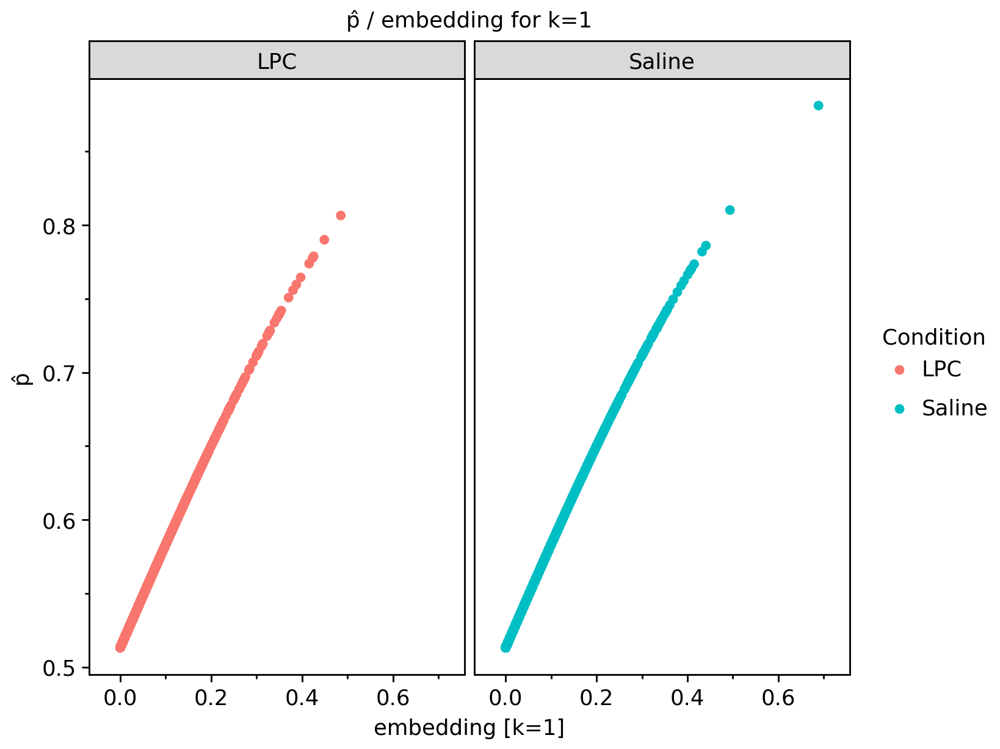

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=1_emb-p-hat_5.png


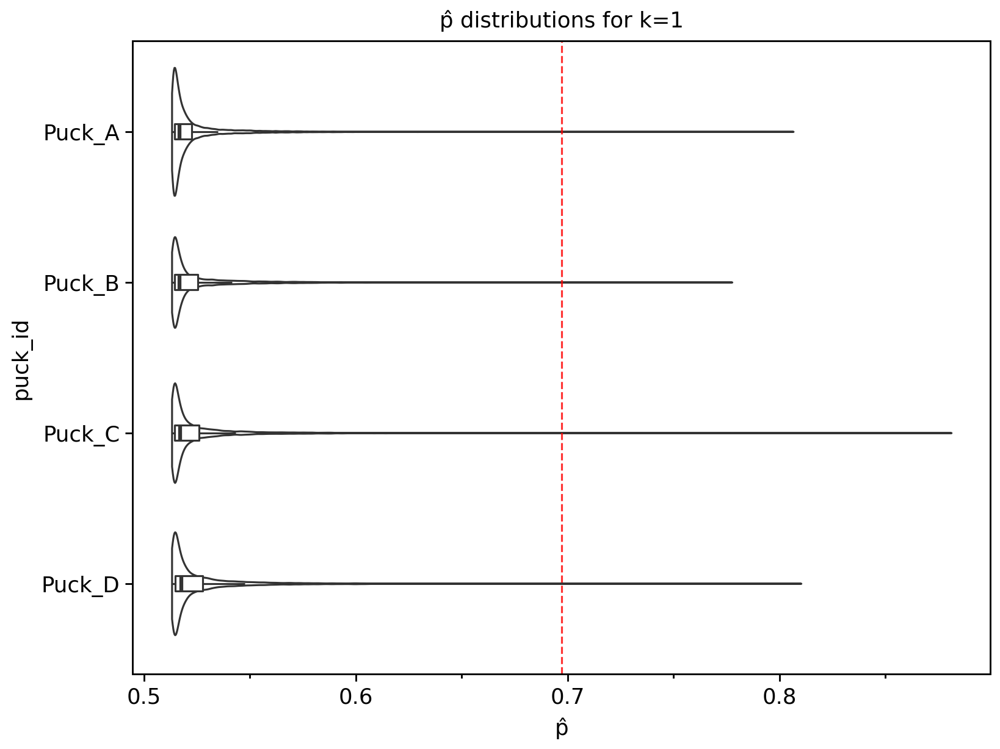

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=1_sample_p-hat_6.png


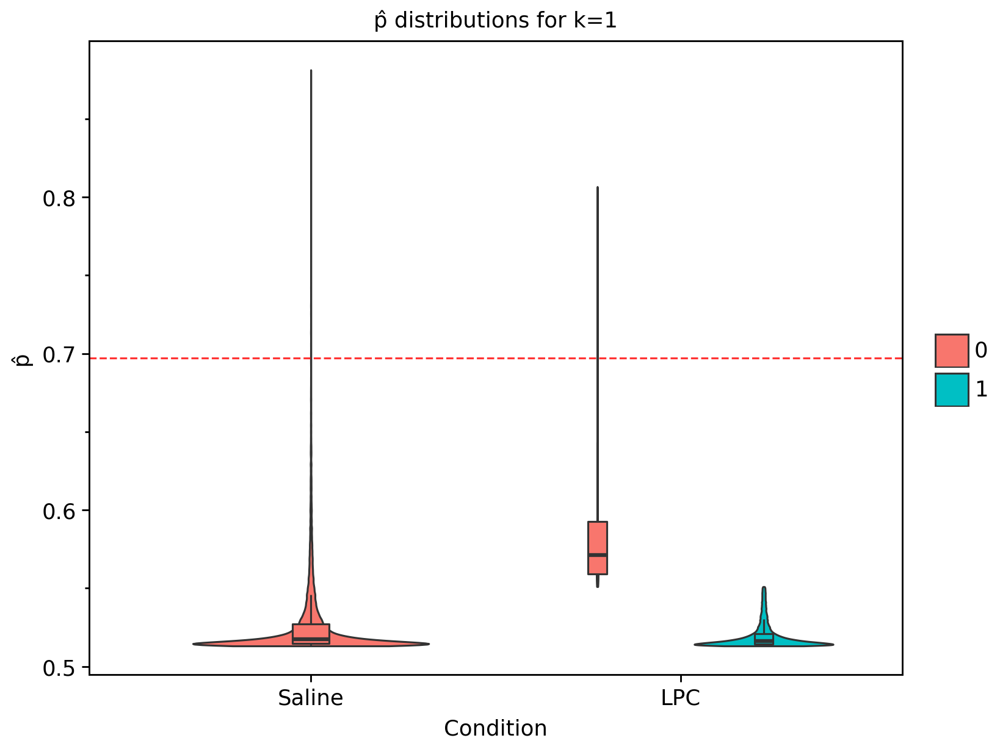

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=1_group_p-hat_7.png


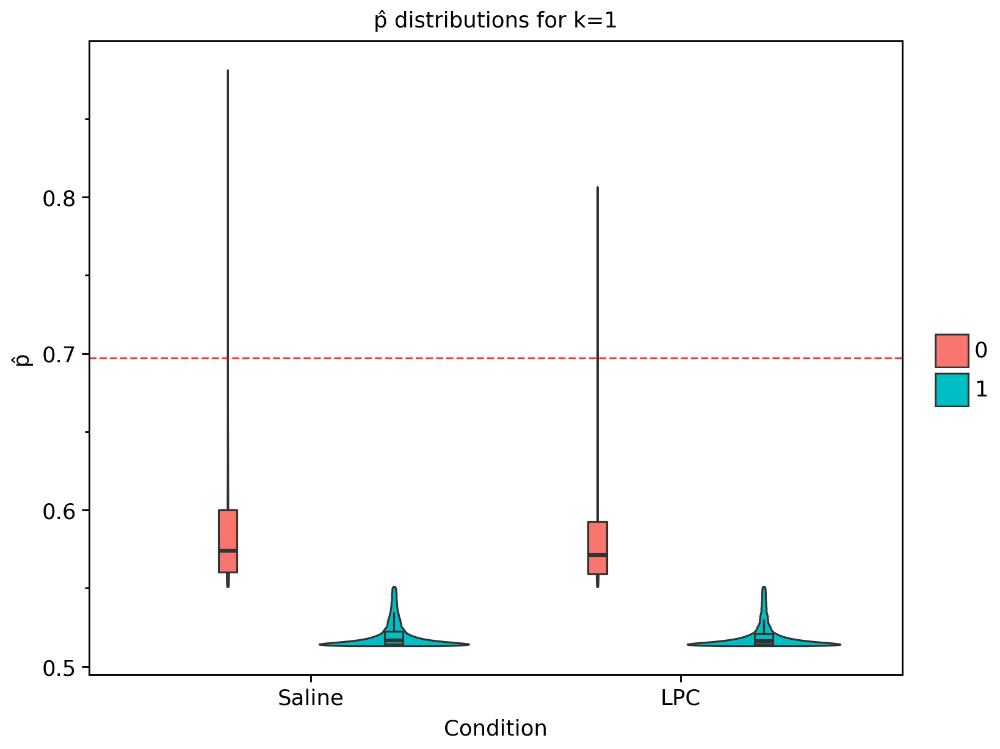

/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:623: PlotnineWarning: Saving 6.4 x 4.8 in image.
/lustre/scratch126/gengen/teams_v2/marks/dp31/elia/spatialPeeler/.venv/lib/python3.10/site-packages/plotnine/ggplot.py:624: PlotnineWarning: Filename: ../figures/rml_case_k=1_group_p-hat_(ctl_split)_8.png


In [35]:
#for k in CTL_KS:
#    for p in pl_help(rml[rml.obsm["X_nmf"][:, k] > 0, :], k, sp_p_size=0.7).values():
#        p.show()

for k in CTL_KS: #
    counter=0
    for name, p in pl_help(rml[rml.obsm["X_nmf"][:, k] > 0, :], k, sp_p_size=0.7).items():
        if "p-hat" in name and "spatial" in name:
            p = p + scale_fill_cmap("magma_r")  # swap "magma" for whichever cmap you want
        p.show()

        safe_name = name.replace(" ", "_").replace("/", "-")
        counter += 1
        p.save(fig_dir / f"rml_case_k={k}_{safe_name}_{counter}.png", dpi=300)




to explore this further, we proceed w/ a gene-wise analysis for all case- and control-specific factors:

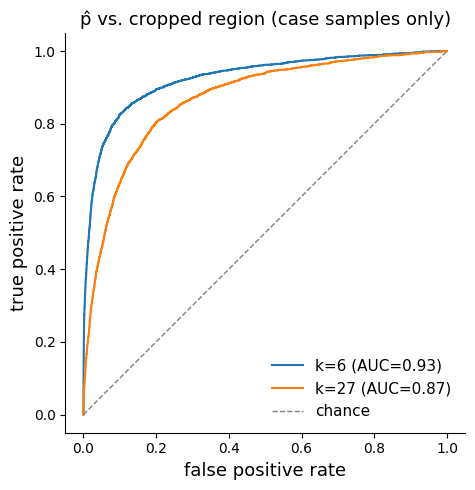

In [42]:
from sklearn.metrics import roc_curve, auc

KS_ROC = [6, 27]
case_mask = (rml.obs["Condition"] != "Saline").to_numpy()
y_true_all = rml.obs["cropped"].to_numpy()

fig, ax = plt.subplots(figsize=(5, 5))

for k in KS_ROC:
    obsm_key = SP_FACT_PAT_STR.format(k=k)
    p_hat_all = rml.obsm[obsm_key][sP.PAT_KEY].to_numpy(dtype=float)

    valid = case_mask & ~np.isnan(p_hat_all)
    y_true = y_true_all[valid]
    y_score = p_hat_all[valid]

    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)
    ax.plot(fpr, tpr, label=f"k={k} (AUC={roc_auc:.2f})")

ax.plot([0, 1], [0, 1], linestyle="--", color="grey", linewidth=1, label="chance")
ax.set_xlabel("false positive rate", fontsize=13)
ax.set_ylabel("true positive rate", fontsize=13)
ax.set_title("p\u0302 vs. cropped region (case samples only)", fontsize=13)
ax.set_aspect("equal")
ax.legend(loc="lower right", fontsize=11, frameon=False)
for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)
fig.tight_layout()

fig.savefig(fig_dir / "rml_roc_phat_vs_cropped.png", dpi=300, bbox_inches="tight")
plt.show()


In [25]:
ks_oi = CASE_KS + CTL_KS

for k in ks_oi:
    sP.run_gene_reg(rml, SP_FACT_PAT_STR.format(k=k), SP_GENE_PAT_STR.format(k=k), layer="counts", run_reg=False)

In [13]:
phat_genes = pd.concat(
    [
        rml.varm[SP_GENE_PAT_STR.format(k=k)].assign(SYMBOL=rml.var["SYMBOL"], k=k).sort_values(
            "corr", ascending=False
        )
        for k in ks_oi
    ]
).reset_index(names="gene")
phat_genes

,gene,corr,wcorr,SYMBOL,k
0,ENSMUSG00000007891,0.723015,0.731972,Ctsd,6
1,ENSMUSG00000050708,0.680711,0.676313,Ftl1,6
2,ENSMUSG00000021939,0.632609,0.706172,Ctsb,6
3,ENSMUSG00000021665,0.616494,0.659282,Hexb,6
4,ENSMUSG00000038642,0.573734,0.613892,Ctss,6
...,...,...,...,...,...
36376,ENSMUSG00000033981,-0.066627,-0.085502,Gria2,1
36377,ENSMUSG00000024617,-0.070833,-0.077564,Camk2a,1
36378,ENSMUSG00000053310,-0.071386,-0.084454,Nrgn,1
36379,ENSMUSG00000056486,-0.075744,-0.088300,Chn1,1


In [23]:
out_path = Path("../.cache/top_phat_genes_rml.csv")
#out_path.parent.mkdir(exist_ok=True)
#phat_genes.to_csv(out_path, index=False)
#print(f"saved {len(phat_genes)} rows to {out_path}")

### read this back in and filter to top 30 per factor
df = pd.read_csv(out_path)
### split based on factor to be comparible wtih phat_genes datastructure
phat_genes_v2 = {factor: group for factor, group in df.groupby('k')}
phat_genes_v2

{1:                      gene      corr     wcorr  SYMBOL  k
 24254  ENSMUSG00000031425  0.868531  0.873379    Plp1  1
 24255  ENSMUSG00000032554  0.697938  0.688597     Trf  1
 24256  ENSMUSG00000006782  0.651096  0.676867     Cnp  1
 24257  ENSMUSG00000024661  0.648791  0.776969    Fth1  1
 24258  ENSMUSG00000027375  0.644531  0.624255     Mal  1
 ...                   ...       ...       ...     ... ..
 36376  ENSMUSG00000033981 -0.066627 -0.085502   Gria2  1
 36377  ENSMUSG00000024617 -0.070833 -0.077564  Camk2a  1
 36378  ENSMUSG00000053310 -0.071386 -0.084454    Nrgn  1
 36379  ENSMUSG00000056486 -0.075744 -0.088300    Chn1  1
 36380  ENSMUSG00000027273 -0.081345 -0.078107  Snap25  1
 
 [12127 rows x 5 columns],
 6:                      gene      corr     wcorr  SYMBOL  k
 0      ENSMUSG00000007891  0.723015  0.731972    Ctsd  6
 1      ENSMUSG00000050708  0.680711  0.676313    Ftl1  6
 2      ENSMUSG00000021939  0.632609  0.706172    Ctsb  6
 3      ENSMUSG00000021665  0.616494 

In [29]:
phat_genes = pd.concat(
    [
        rml.varm[SP_GENE_PAT_STR.format(k=k)].assign(SYMBOL=rml.var["SYMBOL"], k=k).sort_values(
            "corr", ascending=False
        )
        for k in ks_oi
    ]
).reset_index(names="gene")

for k in CASE_KS:
    print(f"k={k}")
    display(phat_genes.loc[phat_genes["k"] == k].drop(columns="k").head(25))


k=6


,gene,corr,wcorr,SYMBOL
0,ENSMUSG00000007891,0.723015,0.731972,Ctsd
1,ENSMUSG00000050708,0.680711,0.676313,Ftl1
2,ENSMUSG00000021939,0.632609,0.706172,Ctsb
3,ENSMUSG00000021665,0.616494,0.659282,Hexb
4,ENSMUSG00000038642,0.573734,0.613892,Ctss
5,ENSMUSG00000036905,0.566627,0.594724,C1qb
6,ENSMUSG00000016256,0.551303,0.628360,Ctsz
7,ENSMUSG00000046805,0.520671,0.548230,Mpeg1
8,ENSMUSG00000050335,0.505278,0.517073,Lgals3
9,ENSMUSG00000029304,0.504369,0.517907,Spp1


k=27


,gene,corr,wcorr,SYMBOL
12127,ENSMUSG00000026728,0.533287,0.643639,Vim
12128,ENSMUSG00000050708,0.431444,0.493599,Ftl1
12129,ENSMUSG00000068220,0.395925,0.566263,Lgals1
12130,ENSMUSG00000029580,0.390799,0.571589,Actb
12131,ENSMUSG00000024661,0.356893,0.496411,Fth1
12132,ENSMUSG00000049775,0.353193,0.503928,Tmsb4x
12133,ENSMUSG00000019874,0.350312,0.453705,Fabp7
12134,ENSMUSG00000037742,0.329869,0.524893,Eef1a1
12135,ENSMUSG00000025351,0.316894,0.456436,Cd63
12136,ENSMUSG00000067274,0.312565,0.503835,Rplp0


we rank genes by their correlation with each factor's p̂ pattern, and list the top genes for each case-specific factor:

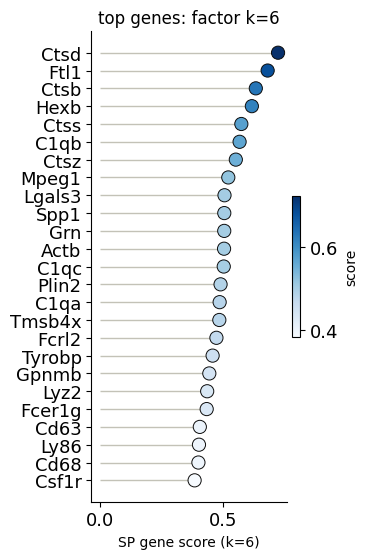

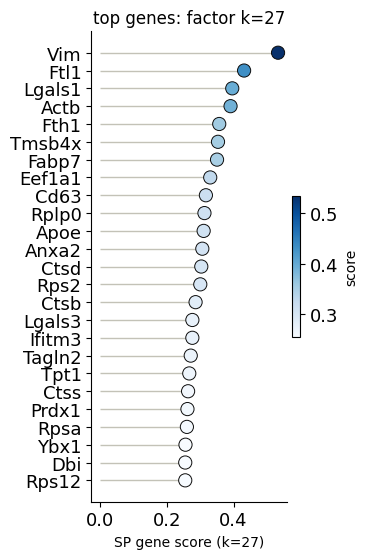

In [ ]:
N_TOP = 25

for k in [6, 27, 1]:
    scores = pd.Series(
        phat_genes.loc[phat_genes["k"] == k].drop(columns="k").set_index("SYMBOL")["corr"].sort_values(ascending=False),
    )
    top_genes = (
        scores.sort_values(ascending=False)
        .head(N_TOP)
        .rename(index=rml.var["SYMBOL"])
        .sort_values()  # ascending so the highest score plots at the top
    )

    fig, ax = plt.subplots(figsize=(3.7, 5.7))
    sca = ax.scatter(
        top_genes.values, np.arange(len(top_genes)),
        c=top_genes.values, cmap="Blues", s=90,
        edgecolors="#0b0b0b", linewidths=0.7, zorder=3,
    )
    ax.hlines(np.arange(len(top_genes)), 0, top_genes.values,
        color="#c3c2b7", linewidth=1, zorder=1)
    ax.set_yticks(np.arange(len(top_genes)))
    ax.set_yticklabels(top_genes.index, fontsize=13)      # gene names
    ax.tick_params(axis="x", labelsize=13)                 # x-axis tick numbers
    ax.set_xlabel(f"SP gene score (k={k})")
    ax.set_title(f"top genes: factor k={k}")
    

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)
    cbar = fig.colorbar(sca, ax=ax, label="score", shrink=0.3, aspect=16, pad=0.02)
    cbar.ax.tick_params(labelsize=13)
    
    fig.tight_layout()

    fig.savefig(fig_dir / f"rml_top_genes_k={k}.pdf", dpi=300, bbox_inches="tight")
    plt.show()


and for each control-specific factor:

In [14]:
for k in CTL_KS:
    print(f"k={k}")
    display(phat_genes.loc[phat_genes["k"] == k].drop(columns="k").head(25))


k=14


,gene,corr,wcorr,SYMBOL
84889,ENSMUSG00000064339,0.617717,0.646446,mt-Rnr2
84890,ENSMUSG00000064341,0.555220,0.602352,mt-Nd1
84891,ENSMUSG00000064337,0.546683,0.546726,mt-Rnr1
84892,ENSMUSG00000064363,0.509669,0.559909,mt-Nd4
84893,ENSMUSG00000064370,0.468128,0.525989,mt-Cytb
84894,ENSMUSG00000064351,0.424986,0.466231,mt-Co1
84895,ENSMUSG00000064345,0.376879,0.426100,mt-Nd2
84896,ENSMUSG00000017390,0.320081,0.354521,Aldoc
84897,ENSMUSG00000027447,0.306208,0.356419,Cst3
84898,ENSMUSG00000004558,0.296946,0.337656,Ndrg2


k=0


,gene,corr,wcorr,SYMBOL
97016,ENSMUSG00000005716,0.702460,0.847829,Pvalb
97017,ENSMUSG00000070880,0.646204,0.824280,Gad1
97018,ENSMUSG00000026576,0.498054,0.701530,Atp1b1
97019,ENSMUSG00000038805,0.489261,0.675454,Six3
97020,ENSMUSG00000039252,0.481438,0.712977,Lgi2
97021,ENSMUSG00000036564,0.422776,0.604734,Ndrg4
97022,ENSMUSG00000058975,0.400131,0.545178,Kcnc1
97023,ENSMUSG00000037771,0.386391,0.589401,Slc32a1
97024,ENSMUSG00000026452,0.379424,0.401106,Syt2
97025,ENSMUSG00000020321,0.379011,0.544810,Mdh1


k=1


,gene,corr,wcorr,SYMBOL
109143,ENSMUSG00000031425,0.868531,0.873379,Plp1
109144,ENSMUSG00000032554,0.697938,0.688597,Trf
109145,ENSMUSG00000006782,0.651096,0.676867,Cnp
109146,ENSMUSG00000024661,0.648791,0.776969,Fth1
109147,ENSMUSG00000027375,0.644531,0.624255,Mal
109148,ENSMUSG00000041607,0.640318,0.704181,Mbp
109149,ENSMUSG00000037625,0.633534,0.646432,Cldn11
109150,ENSMUSG00000026830,0.626772,0.681433,Ermn
109151,ENSMUSG00000027562,0.616691,0.670128,Car2
109152,ENSMUSG00000027199,0.600519,0.631410,Gatm


k=20


,gene,corr,wcorr,SYMBOL
121270,ENSMUSG00000005583,0.540270,0.620587,Mef2c
121271,ENSMUSG00000027273,0.455849,0.603447,Snap25
121272,ENSMUSG00000021268,0.377676,0.565086,Meg3
121273,ENSMUSG00000027270,0.371733,0.380922,Lamp5
121274,ENSMUSG00000036438,0.371649,0.520491,Calm2
121275,ENSMUSG00000001175,0.361874,0.542301,Calm1
121276,ENSMUSG00000053310,0.356707,0.443123,Nrgn
121277,ENSMUSG00000044349,0.340592,0.508011,Snhg11
121278,ENSMUSG00000054459,0.339194,0.453436,Vsnl1
121279,ENSMUSG00000059173,0.338403,0.419392,Pde1a


k=22


,gene,corr,wcorr,SYMBOL
133397,ENSMUSG00000019997,0.489769,0.689777,Ccn2
133398,ENSMUSG00000067879,0.432356,0.589360,Vxn
133399,ENSMUSG00000039714,0.409933,0.605156,Cplx3
133400,ENSMUSG00000045763,0.331482,0.552718,Basp1
133401,ENSMUSG00000027273,0.329732,0.514624,Snap25
133402,ENSMUSG00000075334,0.328364,0.250871,Rprm
133403,ENSMUSG00000028832,0.301791,0.551849,Stmn1
133404,ENSMUSG00000051359,0.298674,0.433142,Ncald
133405,ENSMUSG00000036438,0.291247,0.468059,Calm2
133406,ENSMUSG00000001175,0.290766,0.484994,Calm1


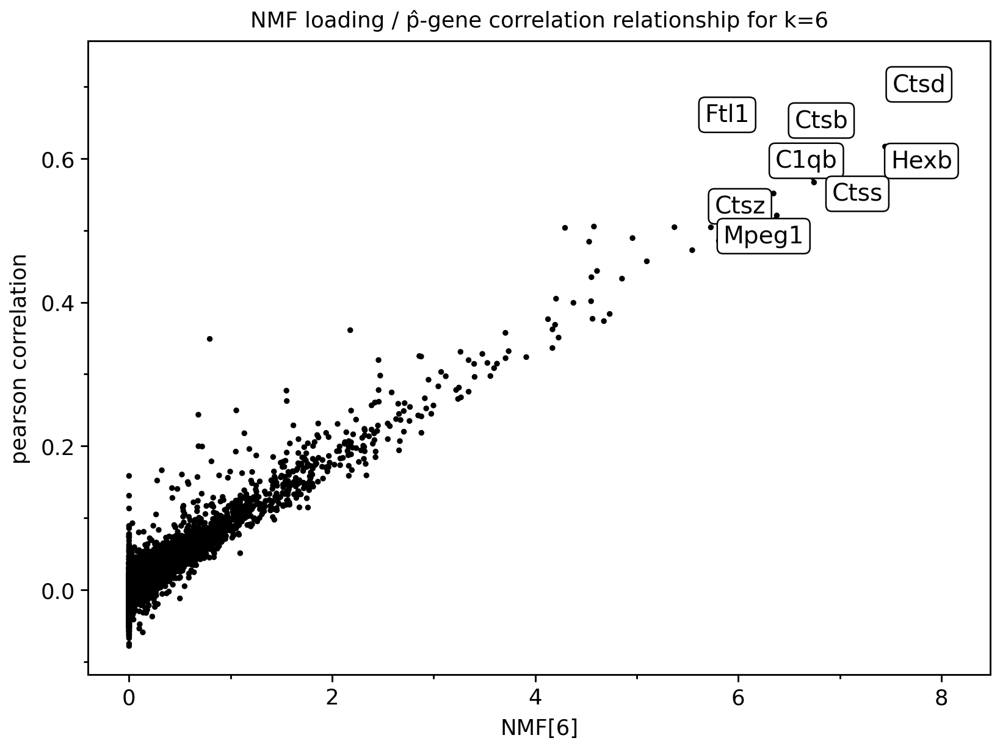

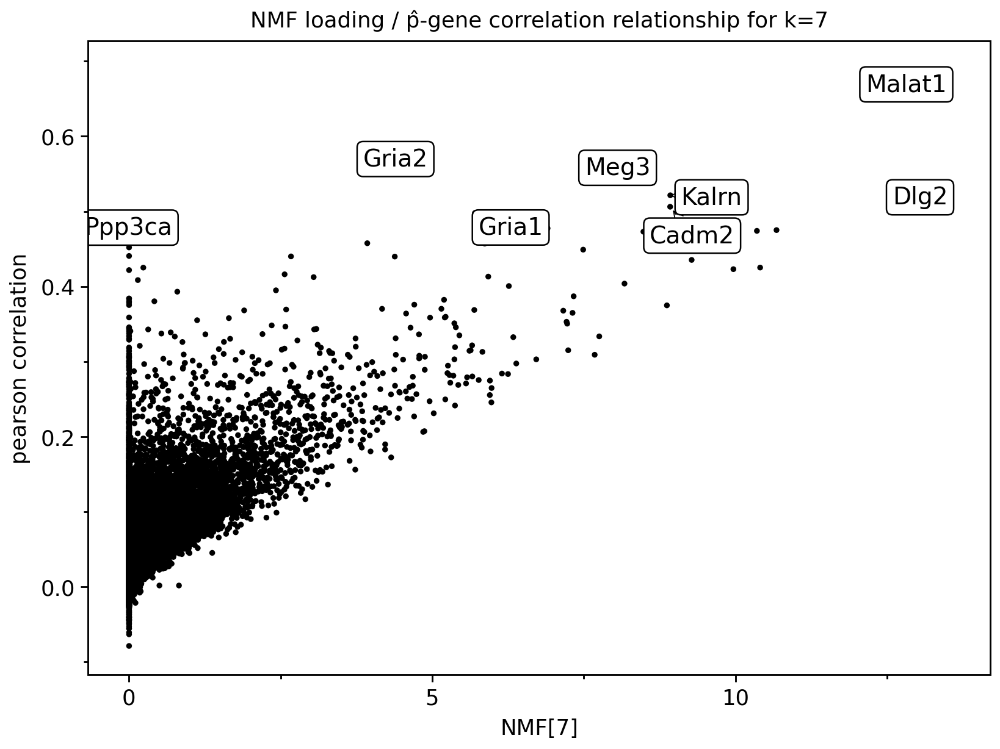

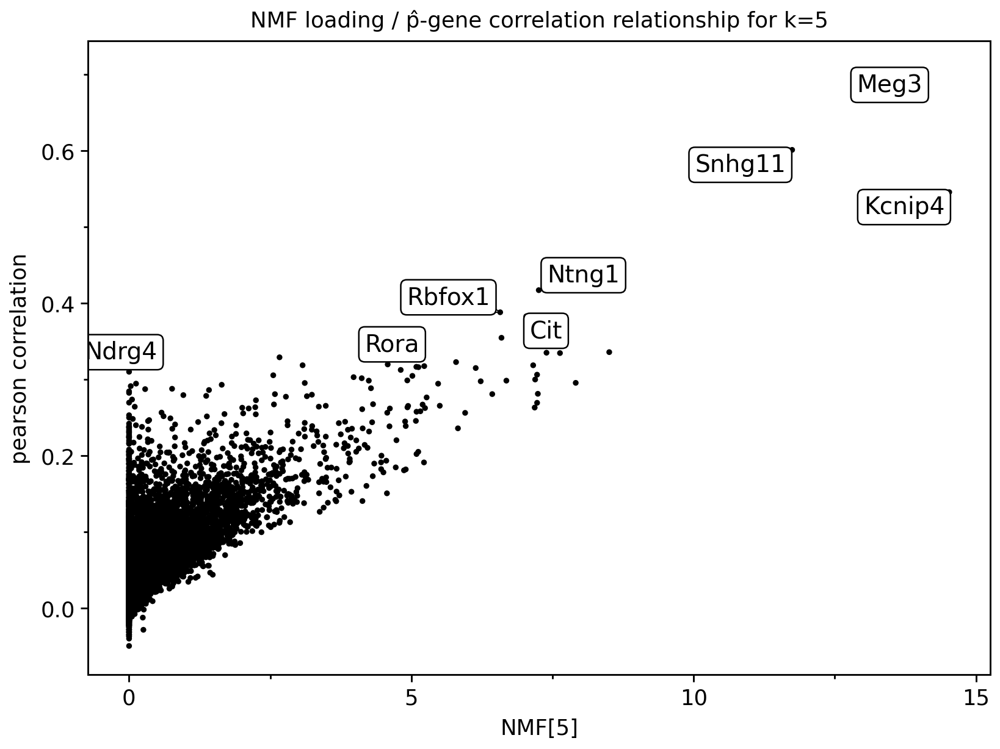

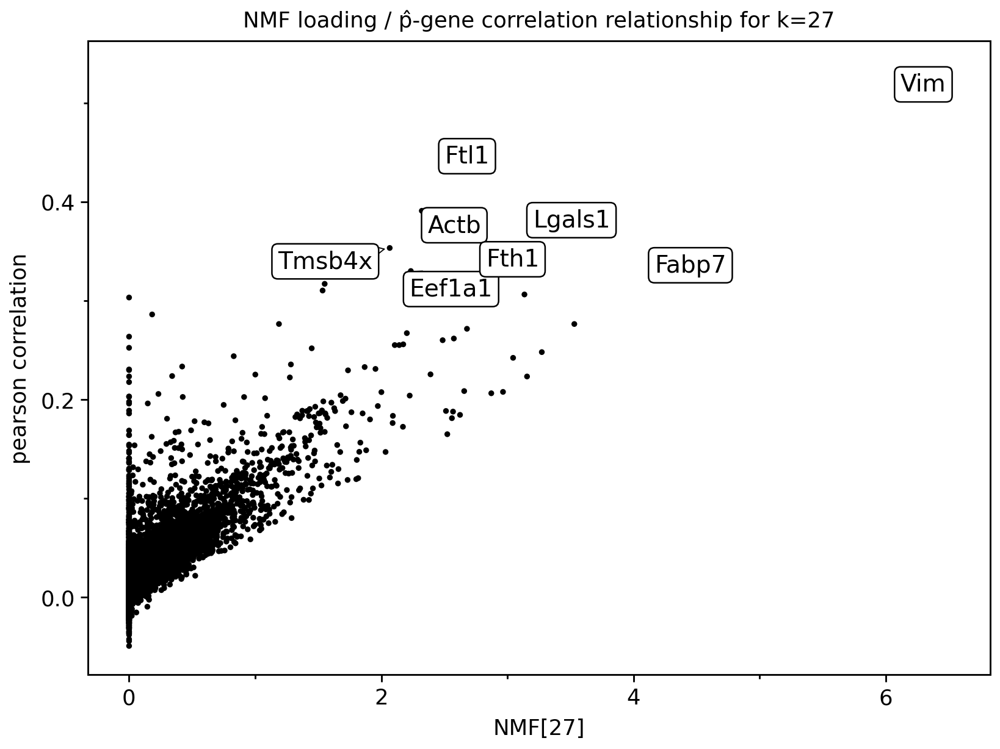

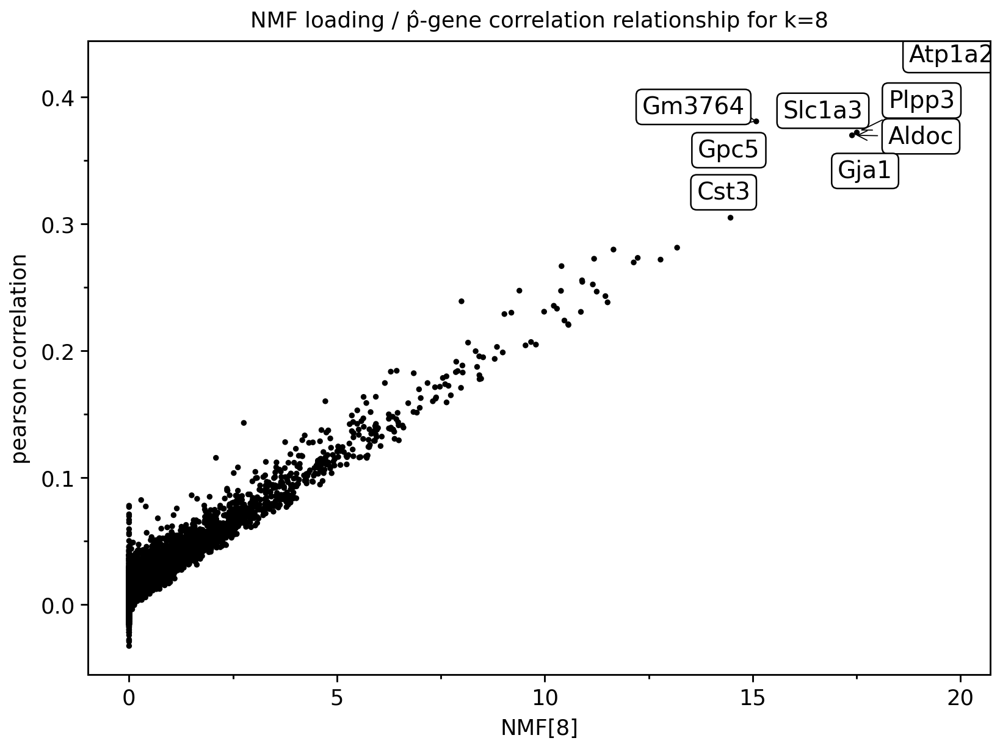

...

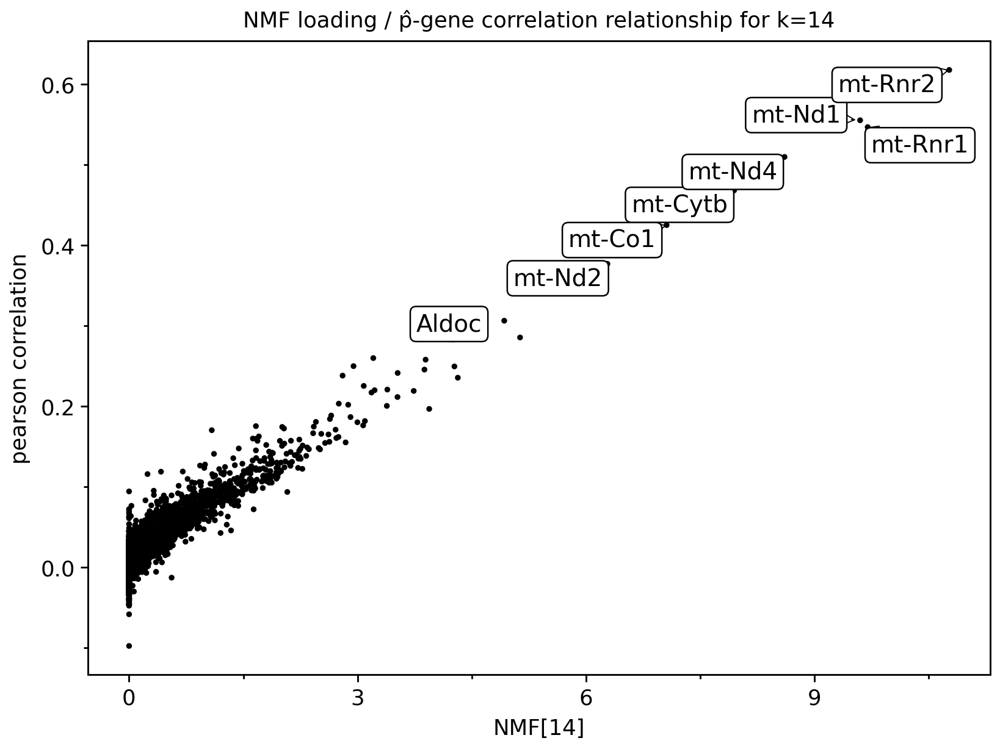

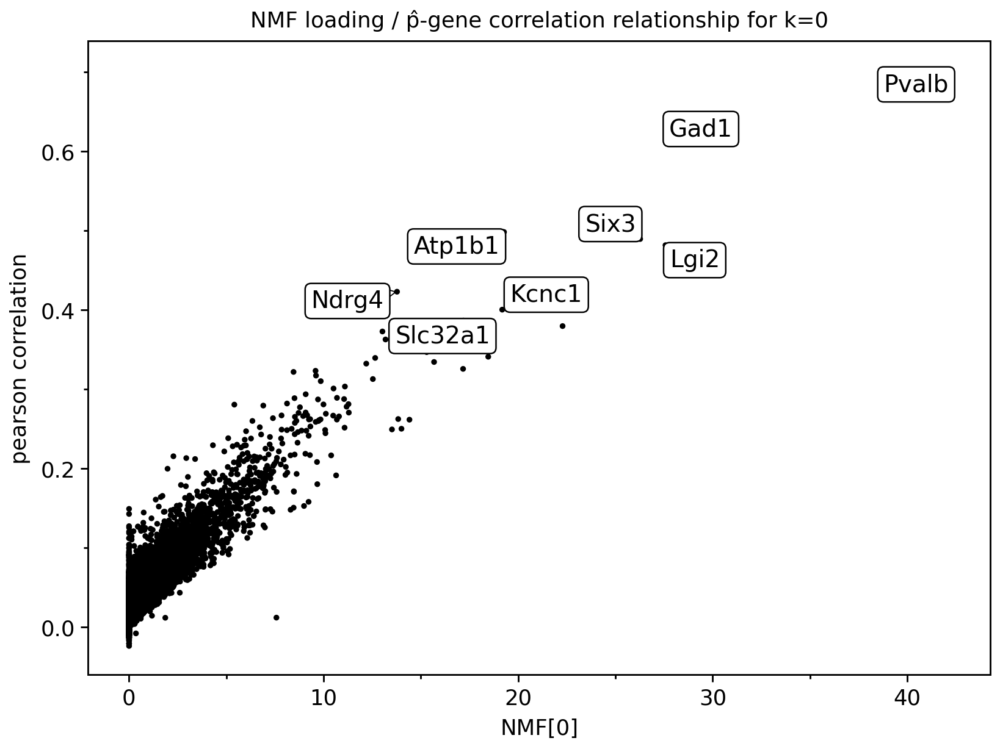

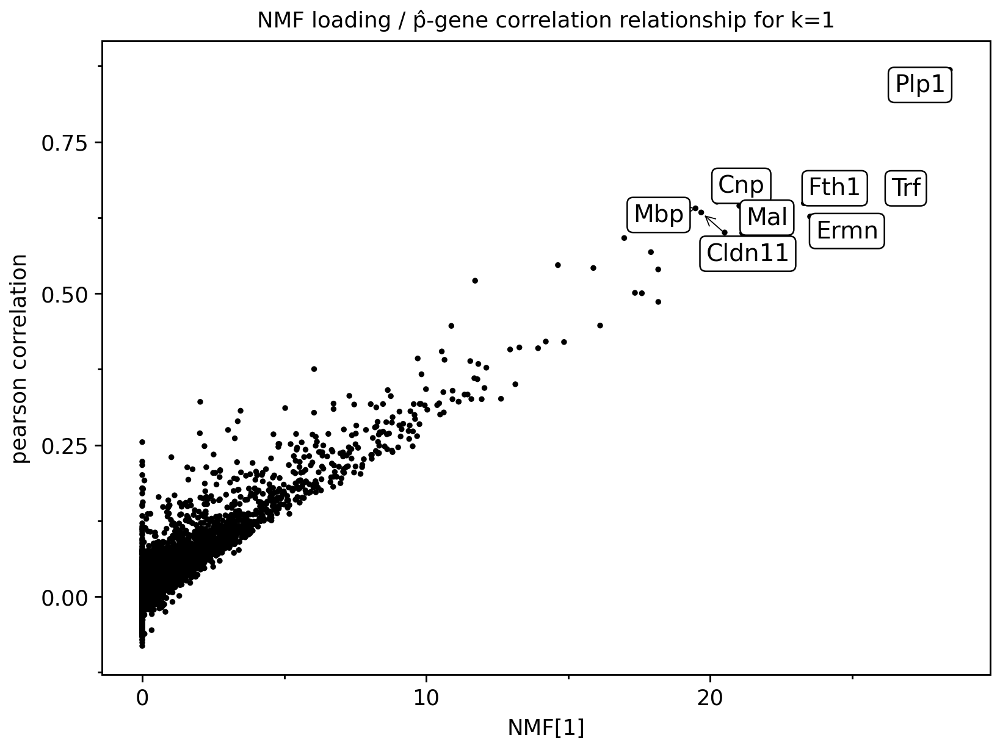

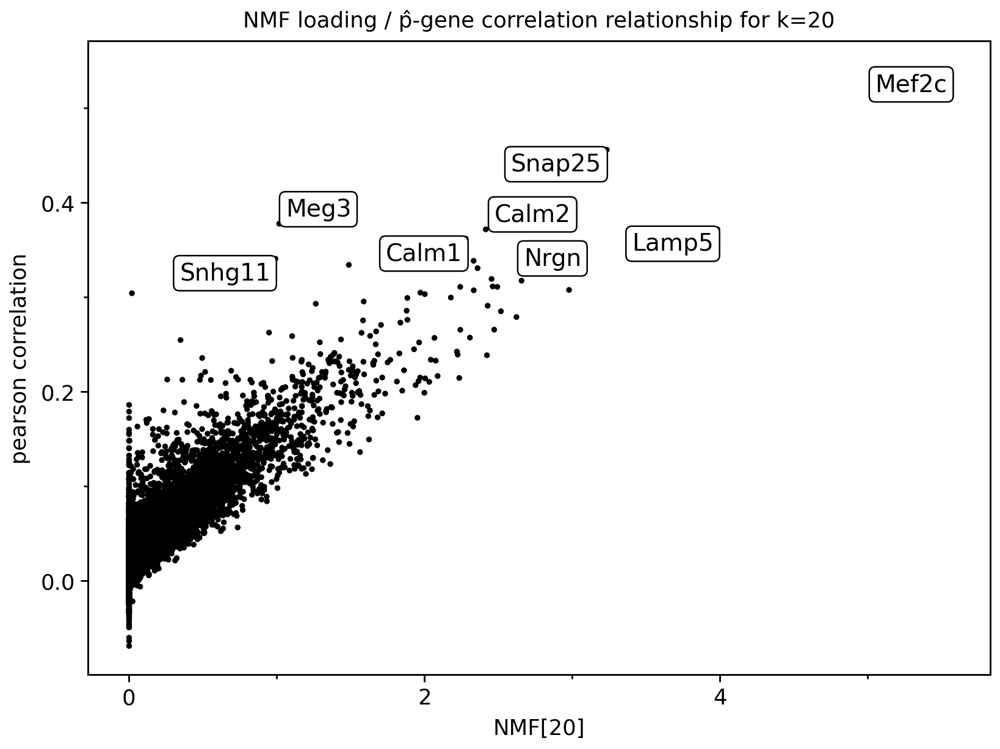

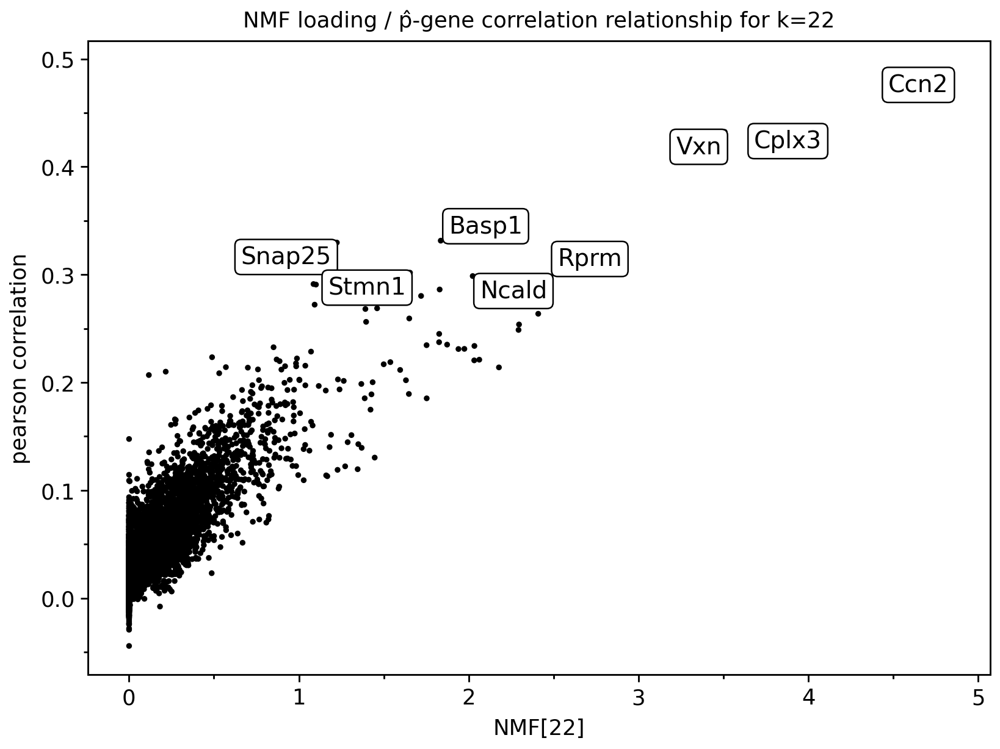

In [15]:
for k in ks_oi:
    (
        uapl.PlotAdata(rml)
        + aes(
            x=uapl.varm("X_nmf", k),
            y=uapl.varm(SP_GENE_PAT_STR.format(k=k), "corr"),
            label=np.where(
                np.argsort(np.argsort(-np.abs(np.asarray(rml.varm[SP_GENE_PAT_STR.format(k=k)]["corr"])))) < 8,
                rml.var["SYMBOL"],
                None,  # ty:ignore[invalid-argument-type]
            ),
        )
        + geom_point(size=1.5, shape="o", stroke=0)
        + geom_label(adjust_text={}, na_rm=True)
        + labs(
            colour="-log(pval)",
            x=f"NMF[{k}]",
            y="pearson correlation",
            title=f"NMF loading / p\u0302-gene correlation relationship for k={k}",
        )
    ).show()

In [16]:
#degs = {k: run_deg_groups(rml, k, "Condition", "Saline") for k in ks_oi}
#sig_sub = {k: degs[k].loc[lambda e: (e["adj_pval"] < 0.05) & (e["lfc"].abs() > 1)] for k in ks_oi}

In [17]:
'''
for k in ks_oi:
    sig_counts = sig_sub[k].groupby("cmp", observed=True)["gene"].count()
    (
        ggplot(sig_counts.reset_index(drop=False))
        + aes(x="cmp", y="gene", fill=after_stat("y"), label=after_stat("y"))
        + geom_col(color="black")
        + geom_text(nudge_y=sig_counts.max() * 0.025)
        + theme(axis_text_x=element_text(angle=45, hjust=1))
        + guides(fill="none")
        + labs(x="", y="# of DEGs (adj_pval < 0.05 & |lfc| > 1)", title=f"DEG counts for k={k}")
    ).show()
'''

'\nfor k in ks_oi:\n    sig_counts = sig_sub[k].groupby("cmp", observed=True)["gene"].count()\n    (\n        ggplot(sig_counts.reset_index(drop=False))\n        + aes(x="cmp", y="gene", fill=after_stat("y"), label=after_stat("y"))\n        + geom_col(color="black")\n        + geom_text(nudge_y=sig_counts.max() * 0.025)\n        + theme(axis_text_x=element_text(angle=45, hjust=1))\n        + guides(fill="none")\n        + labs(x="", y="# of DEGs (adj_pval < 0.05 & |lfc| > 1)", title=f"DEG counts for k={k}")\n    ).show()\n'

we can further visualize the permutations of gene set size in these comparisons via the upsetplot package:

In [18]:
'''
for k in ks_oi:
    with catch_warnings():
        simplefilter(action="ignore", category=FutureWarning)
        up.UpSet(
            up.from_contents({g: v.array for g, v in sig_sub[k].groupby("cmp", observed=True)["gene"]}),
            subset_size="count",
            max_subset_rank=8,
        ).plot()

    plt.show()
'''

'\nfor k in ks_oi:\n    with catch_warnings():\n        simplefilter(action="ignore", category=FutureWarning)\n        up.UpSet(\n            up.from_contents({g: v.array for g, v in sig_sub[k].groupby("cmp", observed=True)["gene"]}),\n            subset_size="count",\n            max_subset_rank=8,\n        ).plot()\n\n    plt.show()\n'